In [128]:
# Standard Library Imports
import sys
import os
import warnings

# Third-Party Data Manipulation and Analysis
import numpy as np
import pandas as pd

# Visualization Libraries
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import missingno as msno
import plotly.express as px

# Statistical and Scientific Computing
from scipy.stats import chi2_contingency, f_oneway, jarque_bera, probplot
import scipy.stats as stats

# Machine Learning and Preprocessing
from sklearn.preprocessing import PowerTransformer

# Jupyter/IPython Utilities
from IPython.display import display

# Warnings Configuration
warnings.filterwarnings("ignore")

In [50]:
project_root = os.path.abspath("..")
if project_root not in sys.path:
    sys.path.append(project_root)

# Now you can import your helper function
from time_prediction.helper_funtions.eda_helper_functions import display_html

In [51]:
# helper functions

def numerical_analysis(dataframe, column_name, cat_col=None, bins="auto"):
    # Set up figure with white background
    fig = plt.figure(figsize=(15, 10), facecolor='white')
    grid = GridSpec(nrows=2, ncols=2, figure=fig)
    ax1 = fig.add_subplot(grid[0, 0])
    ax2 = fig.add_subplot(grid[0, 1])
    ax3 = fig.add_subplot(grid[1, :])
    
    # Modern color palette
    palette = 'viridis'  
    single_color = '#2c7be5'  
    grid_alpha = 0.4
    
    # KDE plot
    if cat_col:
        sns.kdeplot(data=dataframe, x=column_name, hue=cat_col, ax=ax1, 
                   fill=True, palette=palette, alpha=0.6, linewidth=1.5)
    else:
        sns.kdeplot(data=dataframe, x=column_name, ax=ax1, 
                   fill=True, color=single_color, alpha=0.6, linewidth=1.5)
    ax1.set_title('Kernel Density Estimate', fontsize=12, pad=10)
    ax1.grid(True, linestyle=':', alpha=grid_alpha)
    
    # Boxplot
    if cat_col:
        sns.boxplot(data=dataframe, x=column_name, y=cat_col, ax=ax2, 
                   palette=palette, width=0.6, linewidth=1)
    else:
        sns.boxplot(data=dataframe, x=column_name, ax=ax2, 
                   color=single_color, width=0.4, linewidth=1)
    ax2.set_title('Boxplot', fontsize=12, pad=10)
    ax2.grid(True, linestyle=':', alpha=grid_alpha)
    
    # Histogram
    if cat_col:
        sns.histplot(data=dataframe, x=column_name, bins=bins, hue=cat_col, 
                    kde=True, ax=ax3, palette=palette, alpha=0.7, 
                    edgecolor='white', linewidth=0.5)
    else:
        sns.histplot(data=dataframe, x=column_name, bins=bins, kde=True, 
                    ax=ax3, color=single_color, alpha=0.7, 
                    edgecolor='white', linewidth=0.5)
    ax3.set_title('Histogram with KDE', fontsize=12, pad=10)
    ax3.grid(True, linestyle=':', alpha=grid_alpha)
    
    # Adjust layout and remove unnecessary spines
    for ax in [ax1, ax2, ax3]:
        sns.despine(ax=ax, left=True)
    
    plt.tight_layout()
    plt.show()

def numerical_categorical_analysis(dataframe, cat_column_1, num_column):
    fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(16, 9), facecolor='white')

    # Set color palette for consistency
    palette = "Set2"
    single_color = "#3498db"

    # Barplot
    sns.barplot(
        data=dataframe, x=cat_column_1, y=num_column, ax=ax1[0],
        palette=palette
    )
    ax1[0].set_title("Mean Value by Category", fontsize=14)
    ax1[0].grid(True, linestyle='--', alpha=0.5)

    # Boxplot
    sns.boxplot(
        data=dataframe, x=cat_column_1, y=num_column, ax=ax1[1],
        palette="pastel"
    )
    ax1[1].set_title("Distribution by Category (Boxplot)", fontsize=14)
    ax1[1].grid(True, linestyle='--', alpha=0.5)

    # Violin plot
    sns.violinplot(
        data=dataframe, x=cat_column_1, y=num_column, ax=ax2[0],
        palette=palette, inner="quartile"
    )
    ax2[0].set_title("Distribution by Category (Violin)", fontsize=14)
    ax2[0].grid(True, linestyle='--', alpha=0.5)

    # Strip plot, with jitter and transparency for clarity
    sns.stripplot(
        data=dataframe, x=cat_column_1, y=num_column, ax=ax2[1],
        color=single_color, size=4, jitter=True, alpha=0.6
    )
    ax2[1].set_title("Individual Observations (Stripplot)", fontsize=14)
    ax2[1].grid(True, linestyle='--', alpha=0.5)

    # Improve overall layout
    plt.tight_layout()
    plt.show()

def categorical_analysis(dataframe, column_name):
    # Print the value counts and percentages
    display(
        pd.DataFrame({
            "Count": dataframe[column_name].value_counts(),
            "Percentage": (
                dataframe[column_name]
                .value_counts(normalize=True)
                .mul(100)
                .round(2)
                .astype(str)
                .add("%")
            )
        })
    )
    print("-*" * 65)
    # Get unique categories
    unique_categories = dataframe[column_name].unique().tolist()
    number_of_categories = dataframe[column_name].nunique()
    print(f"The unique categories in {column_name} column are {unique_categories}")
    print("-*" * 65)
    print(f"The number of categories in {column_name} column are {number_of_categories}")

    # Enhanced countplot
    plt.figure(figsize=(10, 6), facecolor='white')
    ax = sns.countplot(
        data=dataframe,
        x=column_name,
        palette="Set2",
        edgecolor='black'
    )
    plt.xticks(rotation=45)
    plt.title(f'Count of Categories in {column_name}', fontsize=16)
    plt.xlabel(column_name, fontsize=13)
    plt.ylabel('Count', fontsize=13)
    ax.grid(axis='y', linestyle='--', alpha=0.6)

    # Annotate bars with counts
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=11, color='black', fontweight='bold')

    plt.tight_layout()
    plt.show()



def multivariate_analysis(dataframe, num_column, cat_column_1, cat_column_2):
    fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(16, 9), facecolor='white')

    palette = "Set2"

    # Barplot
    sns.barplot(
        data=dataframe, x=cat_column_1, y=num_column,
        hue=cat_column_2, ax=ax1[0], palette=palette, edgecolor="black"
    )
    ax1[0].set_title("Mean Value by Category (Barplot)", fontsize=14)
    ax1[0].grid(True, linestyle="--", alpha=0.5)
    ax1[0].legend(title=cat_column_2, loc="best")

    # Boxplot
    sns.boxplot(
        data=dataframe, x=cat_column_1, y=num_column,
        hue=cat_column_2, ax=ax1[1], palette="pastel"
    )
    ax1[1].set_title("Distribution by Category (Boxplot)", fontsize=14)
    ax1[1].grid(True, linestyle="--", alpha=0.5)
    ax1[1].legend(title=cat_column_2, loc="best")

    # Violin plot
    sns.violinplot(
        data=dataframe, x=cat_column_1, y=num_column,
        hue=cat_column_2, ax=ax2[0], palette=palette, split=True, inner="quartile"
    )
    ax2[0].set_title("Distribution by Category (Violin)", fontsize=14)
    ax2[0].grid(True, linestyle="--", alpha=0.5)
    ax2[0].legend(title=cat_column_2, loc="best")

    # Strip plot
    sns.stripplot(
        data=dataframe, x=cat_column_1, y=num_column,
        hue=cat_column_2, dodge=True, ax=ax2[1], palette=palette, size=4, alpha=0.6
    )
    ax2[1].set_title("Individual Observations (Stripplot)", fontsize=14)
    ax2[1].grid(True, linestyle="--", alpha=0.5)
    ax2[1].legend(title=cat_column_2, loc="best")

    # Handle overlapping legends
    for a in [ax1[0], ax1[1], ax2[0], ax2[1]]:
        handles, labels = a.get_legend_handles_labels()
        if len(handles) > 0:
            a.legend(title=cat_column_2, loc="best")
        else:
            a.legend_.remove() if hasattr(a, "legend_") and a.legend_ else None

    plt.tight_layout()
    plt.show()

def chi_2_test(dataframe, col1, col2, alpha=0.05):
    # Prepare data and drop missing values
    data = dataframe.loc[:, [col1, col2]].dropna()

    # Create and display the contingency table
    contingency_table = pd.crosstab(data[col1], data[col2])
    print(f"\nContingency Table between '{col1}' and '{col2}':")
    display(contingency_table)
    print("-*" * 65)

    # Perform chi-squared test
    chi2, p_val, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-squared Statistic: {chi2:.4f}")
    print(f"Degrees of Freedom: {dof}")
    print(f"P-value: {p_val:.4g}")
    print("-*" * 65)

    # Interpret the result
    if p_val <= alpha:
        print(f"Reject the null hypothesis (p ≤ {alpha}). There is a significant association between '{col1}' and '{col2}'.")
    else:
        print(f"Fail to reject the null hypothesis (p > {alpha}). There is no significant association between '{col1}' and '{col2}'.")

def anova_test(dataframe, num_col, cat_col, alpha=0.05):

    # Drop missing values
    data = dataframe.loc[:, [num_col, cat_col]].dropna()

    # Prepare groups for ANOVA
    cat_group = data.groupby(cat_col)
    groups = [group[num_col].values for _, group in cat_group]

    # Perform one-way ANOVA
    f_stat, p_val = f_oneway(*groups)

    # Print ANOVA summary
    print(f"ANOVA Results for '{num_col}' by '{cat_col}':")
    print(f"F-statistic: {f_stat:.4f}")
    print(f"P-value: {p_val:.4g}")
    print("-*" * 65)

    # Interpretation
    if p_val <= alpha:
        print(f"Reject the null hypothesis (p ≤ {alpha}). There is a significant relationship between '{num_col}' and '{cat_col}'.")
    else:
        print(f"Fail to reject the null hypothesis (p > {alpha}). There is no significant relationship between '{num_col}' and '{cat_col}'.")


def test_for_normality(dataframe, column_name, alpha=0.05):

    data = dataframe[column_name].dropna()
    print("Jarque-Bera Test for Normality")
    stat, p_val = jarque_bera(data)
    print(f"Test Statistic: {stat:.4f}")
    print(f"P-value: {p_val:.4g}")
    print(f"Significance Level (alpha): {alpha}")
    print("-*" * 65)
    if p_val <= alpha:
        print("Reject the null hypothesis. The data is NOT normally distributed.")
    else:
        print("Fail to reject the null hypothesis. The data is normally distributed.")

In [52]:
# Set style for better aesthetics
sns.set_style("whitegrid")
sns.set_palette("husl")

In [53]:
pd.set_option('display.max_columns', None)

In [54]:
# path = "/Users/aryagupta/Desktop/food-delivery-estimation/food_time_prediction_using_mlops/data/processed/clean_train.csv"

path = "/Users/aryagupta/Desktop/food-delivery-estimation/food_time_prediction_using_mlops/data/interim/train_interim.csv"
data = pd.read_csv(path)

In [55]:
data.sample(5)

,Unnamed: 0,id,person_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked,weather,traffic,vehicle_condition,order_type,vehical_type,multiple_deliveries,is_festival,city_category,time,city,day,month,year,day_of_week,is_weekend,order_time_hour,order_time_of_day,pickup_time,distance
16913,16944,0x1c18,CHENRES010DEL03,30.0,4.6,13.066762,80.251865,13.126762,80.311865,2022-03-26,2025-05-23 23:50:00,2025-05-23 00:00:00,sunny,low,0,meal,motorcycle,1.0,no,urban,28,CHEN,26,3,2022,Saturday,1,23.0,night,-1430.0,9.313300
4483,4487,0x93cc,PUNERES19DEL02,36.0,4.9,18.563934,73.915367,18.693935,74.045367,2022-03-16,2025-05-23 22:20:00,2025-05-23 22:25:00,fog,low,0,meal,motorcycle,1.0,no,metropolitian,43,PUNE,16,3,2022,Wednesday,0,22.0,night,5.0,19.914687
2509,2510,0x215e,MUMRES13DEL02,20.0,4.5,19.178321,72.834715,19.228321,72.884715,2022-03-26,2025-05-23 21:35:00,2025-05-23 21:40:00,cloudy,jam,1,buffet,scooter,0.0,no,metropolitian,27,MUM,26,3,2022,Saturday,1,21.0,night,5.0,7.647048
24185,24230,0xa899,MYSRES010DEL01,39.0,4.7,12.321214,76.621094,12.331214,76.631094,2022-03-30,2025-05-23 10:20:00,2025-05-23 10:30:00,fog,low,2,buffet,scooter,0.0,no,metropolitian,15,MYS,30,3,2022,Wednesday,0,10.0,morning,10.0,1.554514
33996,34065,0xdc00,AURGRES19DEL02,28.0,4.8,19.866969,75.318894,19.946969,75.398894,2022-02-18,2025-05-23 22:40:00,2025-05-23 22:50:00,cloudy,low,2,meal,scooter,1.0,no,metropolitian,29,AURG,18,2,2022,Friday,0,22.0,night,10.0,12.210199


In [56]:
data.drop(["Unnamed: 0", 'person_id'] , axis = 1, inplace = True)

In [57]:
data['distance_type'] = pd.cut(
    data["distance"],
    bins = [0, 5, 10, 15, 25],
    right = False,
    labels = ["short", "medium", "long", "very_long"]
)

In [58]:
print(f"There are {data.shape[0]} Rows and {data.shape[1]} colummns")

There are 45502 Rows and 30 colummns


In [59]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45502 entries, 0 to 45501
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   id                    45502 non-null  object  
 1   age                   43648 non-null  float64 
 2   ratings               43594 non-null  float64 
 3   restaurant_latitude   41473 non-null  float64 
 4   restaurant_longitude  41737 non-null  float64 
 5   delivery_latitude     41872 non-null  float64 
 6   delivery_longitude    41872 non-null  float64 
 7   order_date            45502 non-null  object  
 8   order_time            43862 non-null  object  
 9   order_picked          45502 non-null  object  
 10  weather               44977 non-null  object  
 11  traffic               44992 non-null  object  
 12  vehicle_condition     45502 non-null  int64   
 13  order_type            45502 non-null  object  
 14  vehical_type          45502 non-null  object  
 15  mu

In [60]:
data.isna().sum()

id                         0
age                     1854
ratings                 1908
restaurant_latitude     4029
restaurant_longitude    3765
delivery_latitude       3630
delivery_longitude      3630
order_date                 0
order_time              1640
order_picked               0
weather                  525
traffic                  510
vehicle_condition          0
order_type                 0
vehical_type               0
multiple_deliveries      993
is_festival              228
city_category           1198
time                       0
city                       0
day                        0
month                      0
year                       0
day_of_week                0
is_weekend                 0
order_time_hour         1640
order_time_of_day          0
pickup_time             1640
distance                4029
distance_type           4029
dtype: int64

In [61]:
data.dtypes

id                        object
age                      float64
ratings                  float64
restaurant_latitude      float64
restaurant_longitude     float64
delivery_latitude        float64
delivery_longitude       float64
order_date                object
order_time                object
order_picked              object
weather                   object
traffic                   object
vehicle_condition          int64
order_type                object
vehical_type              object
multiple_deliveries      float64
is_festival               object
city_category             object
time                       int64
city                      object
day                        int64
month                      int64
year                       int64
day_of_week               object
is_weekend                 int64
order_time_hour          float64
order_time_of_day         object
pickup_time              float64
distance                 float64
distance_type           category
dtype: obj

In [62]:
all_col = data.columns.to_list()

numerical_col = ['age', 'ratings', 'restaurant_latitude', 'restaurant_longitude', 'delivery_latitude', 'delivery_longitude',
                'vehicle_condition', 'multiple_deliveries', 'time', 'order_day', 'order_month', 'pickup_time_minutes',
                 'order_time_hour', 'distance'
                ]
boolean = ['is_weekend']

categorical_col = []

for i in all_col:
    if i not in numerical_col and i not in boolean:
        categorical_col.append(i)

categorical_col

['id',
 'order_date',
 'order_time',
 'order_picked',
 'weather',
 'traffic',
 'order_type',
 'vehical_type',
 'is_festival',
 'city_category',
 'city',
 'day',
 'month',
 'year',
 'day_of_week',
 'order_time_of_day',
 'pickup_time',
 'distance_type']

In [63]:
data.sample(5)

,id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked,weather,traffic,vehicle_condition,order_type,vehical_type,multiple_deliveries,is_festival,city_category,time,city,day,month,year,day_of_week,is_weekend,order_time_hour,order_time_of_day,pickup_time,distance,distance_type
32999,0xcd9d,21.0,4.9,30.914057,75.839820,30.924057,75.849820,2022-02-11,2025-05-23 10:50:00,2025-05-23 11:05:00,cloudy,low,0,buffet,motorcycle,1.0,no,metropolitian,16,LUDH,11,2,2022,Friday,0,10.0,morning,15.0,1.465067,short
10621,0x350f,20.0,4.8,21.186438,72.794115,21.196438,72.804115,2022-04-01,2025-05-23 10:45:00,2025-05-23 10:55:00,fog,low,2,snack,motorcycle,0.0,no,metropolitian,19,SUR,1,4,2022,Friday,0,10.0,morning,10.0,1.520295,short
2875,0xd333,21.0,4.4,30.366322,78.070453,30.456322,78.160453,2022-02-12,2025-05-23 17:15:00,2025-05-23 17:20:00,windy,medium,0,buffet,motorcycle,1.0,no,urban,34,DEH,12,2,2022,Saturday,1,17.0,evening,5.0,13.215100,long
32128,0x7b09,35.0,4.7,13.026286,80.275235,13.046286,80.295235,2022-03-05,2025-05-23 08:25:00,2025-05-23 08:40:00,windy,low,1,drinks,motorcycle,0.0,no,urban,25,CHEN,5,3,2022,Saturday,1,8.0,morning,15.0,3.104804,short
35778,0x7665,39.0,4.4,13.029780,80.208812,13.159780,80.338812,2022-03-02,2025-05-23 17:45:00,2025-05-23 18:00:00,windy,medium,0,buffet,motorcycle,0.0,no,metropolitian,31,CHEN,2,3,2022,Wednesday,0,17.0,evening,15.0,20.178894,very_long


## **Column Wise Analysis**

In [64]:
data.columns

Index(['id', 'age', 'ratings', 'restaurant_latitude', 'restaurant_longitude',
       'delivery_latitude', 'delivery_longitude', 'order_date', 'order_time',
       'order_picked', 'weather', 'traffic', 'vehicle_condition', 'order_type',
       'vehical_type', 'multiple_deliveries', 'is_festival', 'city_category',
       'time', 'city', 'day', 'month', 'year', 'day_of_week', 'is_weekend',
       'order_time_hour', 'order_time_of_day', 'pickup_time', 'distance',
       'distance_type'],
      dtype='object')

### Time (target feature)

In [65]:
data['time'].dtype

dtype('int64')

In [66]:
data['time'].isna().sum()

np.int64(0)

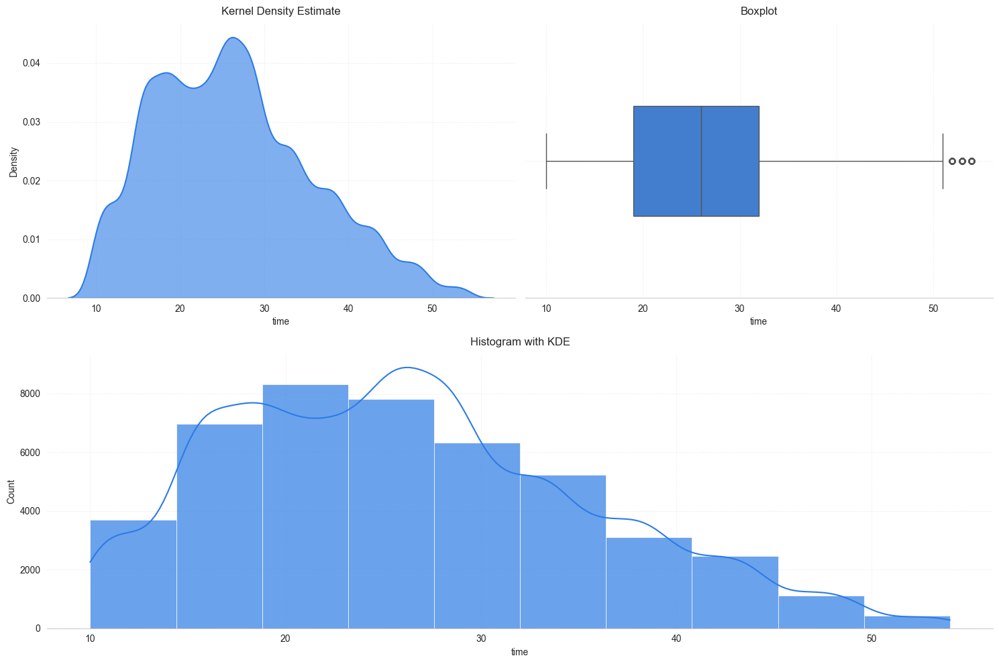

In [67]:
numerical_analysis(data, 'time', bins = 10)

### Key Observations:

- The target column is not completely continuous.
- It exhibits a bimodal distribution, with two prominent peaks: one near 17–18 and another around 26–27.
- There are a few extreme values present in the target column. While these points are rare and unusually high, they are not true outliers, as delivery times of up to 50 minutes can occasionally occur.


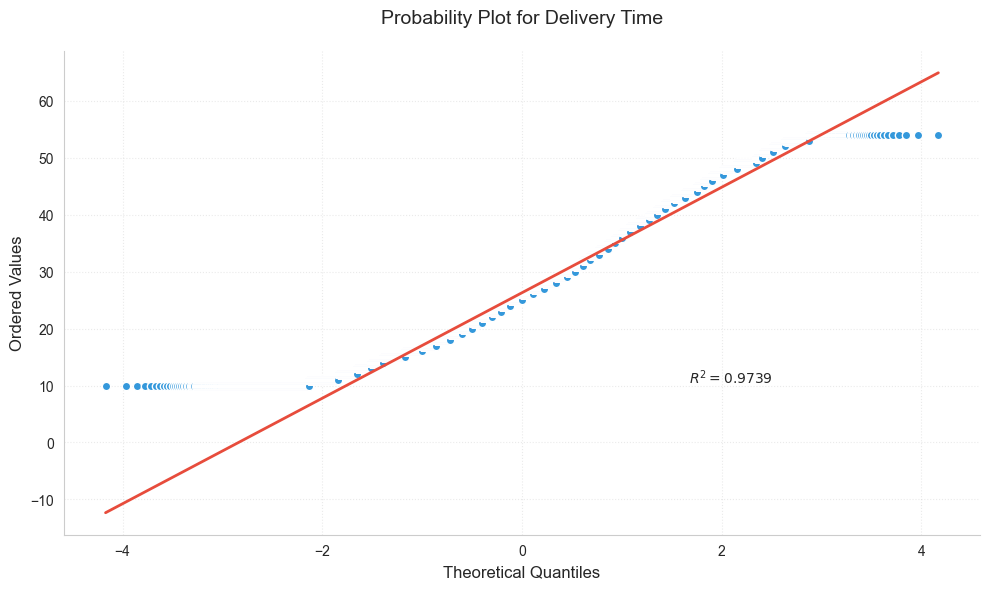

In [68]:
# plot QQ plot for the target

plt.figure(figsize = (10, 6))

# Create the probability plot with custom styling
stats.probplot(data['time'], plot = plt, rvalue = True, fit = True)

# Customize the appearance
plot_lines = plt.gca().get_lines()
plot_lines[0].set_marker('o')                # Sample points
plot_lines[0].set_markerfacecolor('#3498db') # Blue fill
plot_lines[0].set_markeredgecolor('white')   # White edges
plot_lines[0].set_markersize(6)             # Appropriate size
plot_lines[1].set_color('#e74c3c')          # Red line for fit
plot_lines[1].set_linewidth(2)              # Thicker line

# Add titles and labels
plt.title('Probability Plot for Delivery Time', fontsize = 14, pad = 20)
plt.xlabel('Theoretical Quantiles', fontsize = 12)
plt.ylabel('Ordered Values', fontsize = 12)

# Style enhancements
plt.grid(True, linestyle = ':', alpha = 0.4)
sns.despine()                            
plt.tight_layout()                       
plt.show()

In [69]:
# tests for normailty
test_for_normality(data, 'time')

Jarque-Bera Test for Normality
Test Statistic: 1972.2806
P-value: 0
Significance Level (alpha): 0.05
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis. The data is NOT normally distributed.


As we can see that Target col is not **normally** distributed using the **QQ Plot** and **Jarque Bera Test**

In [70]:
# check out the rows where data is acting as outlier
target_25_per, target_75_per = np.percentile(data['time'], [25, 75])
iqr = target_75_per - target_25_per

upper_bound = target_75_per + (1.5 * iqr)

pd.DataFrame(data.loc[(data['time'] > upper_bound), "traffic"].value_counts())

,count
traffic,
jam,241
high,24


In [71]:
pd.DataFrame(data.loc[(data['time'] > upper_bound), "weather"].value_counts())

,count
weather,
fog,57
sunny,51
cloudy,44
windy,44
stormy,37
sandstorms,32


In [72]:
# average distances
avg_distance = data.loc[:, "distance"].mean()
avg_distance_extreme = data.loc[(data['time'] > upper_bound), "distance"].mean()

print(avg_distance, avg_distance_extreme)

9.71925622902865 13.259733986308081


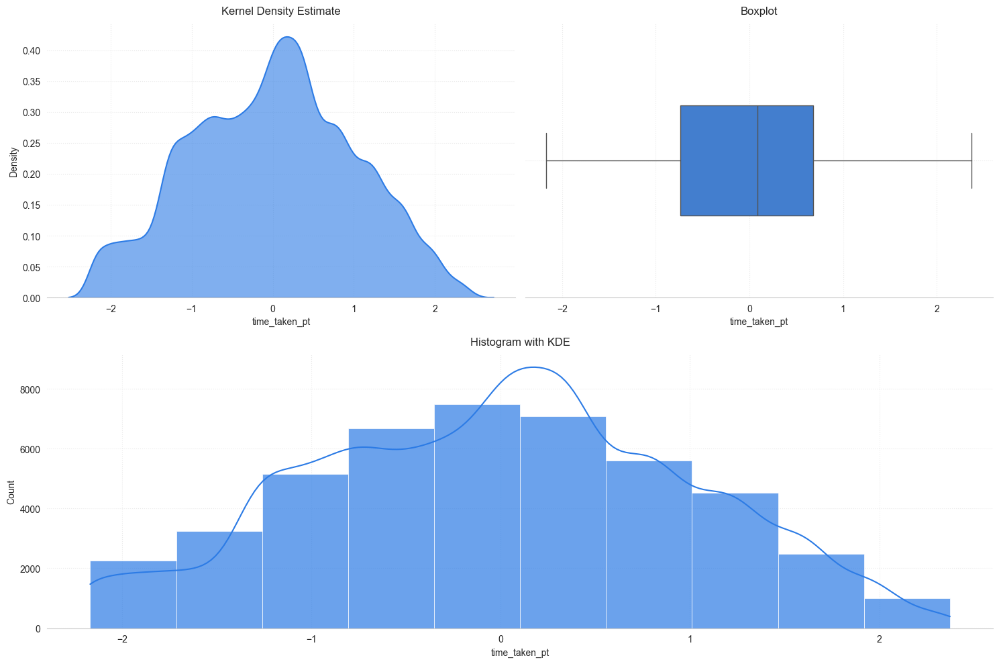

In [73]:
# fix traget column using transformation

pt = PowerTransformer(method='yeo-johnson')
data['time_taken_pt'] = pt.fit_transform(data[['time']])

numerical_analysis(data, "time_taken_pt", bins = 10)

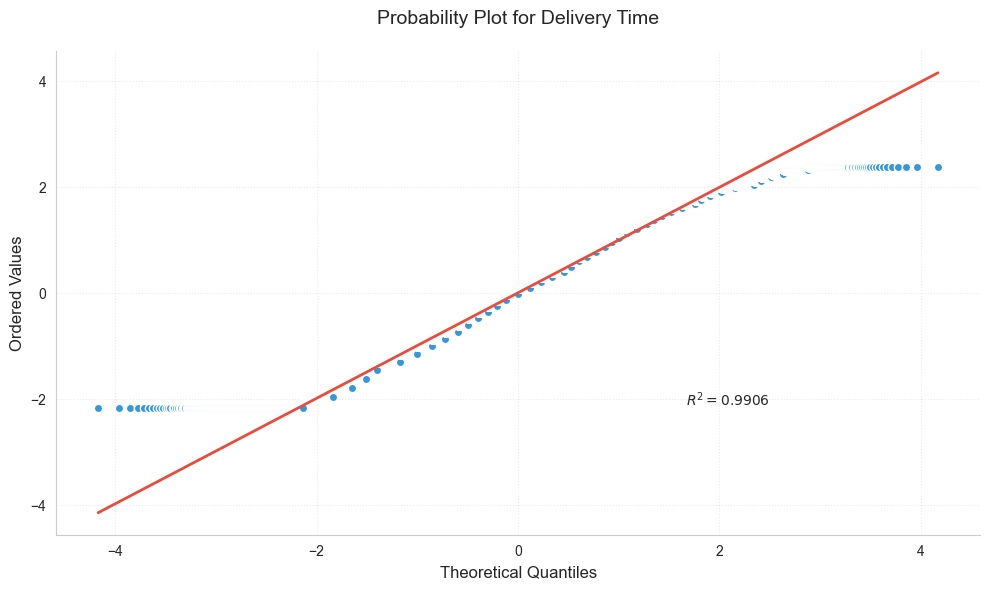

In [74]:
# plot QQ plot for the target
plt.figure(figsize = (10, 6))

# Create the probability plot with custom styling
stats.probplot(data['time_taken_pt'], plot = plt, rvalue = True, fit = True)

# Customize the appearance
plot_lines = plt.gca().get_lines()
plot_lines[0].set_marker('o')                # Sample points
plot_lines[0].set_markerfacecolor('#3498db') # Blue fill
plot_lines[0].set_markeredgecolor('white')   # White edges
plot_lines[0].set_markersize(6)             # Appropriate size
plot_lines[1].set_color('#e74c3c')          # Red line for fit
plot_lines[1].set_linewidth(2)              # Thicker line

# Add titles and labels
plt.title('Probability Plot for Delivery Time', fontsize = 14, pad = 20)
plt.xlabel('Theoretical Quantiles', fontsize = 12)
plt.ylabel('Ordered Values', fontsize = 12)

# Style enhancements
plt.grid(True, linestyle = ':', alpha = 0.4)
sns.despine()                            
plt.tight_layout()                       
plt.show()

### `Age`

In [75]:
data['age'].dtype

dtype('float64')

In [76]:
pd.DataFrame(data['age'].describe())

,age
count,43648.000000
mean,29.555008
std,5.761482
min,20.000000
25%,25.000000
50%,30.000000
75%,35.000000
max,39.000000


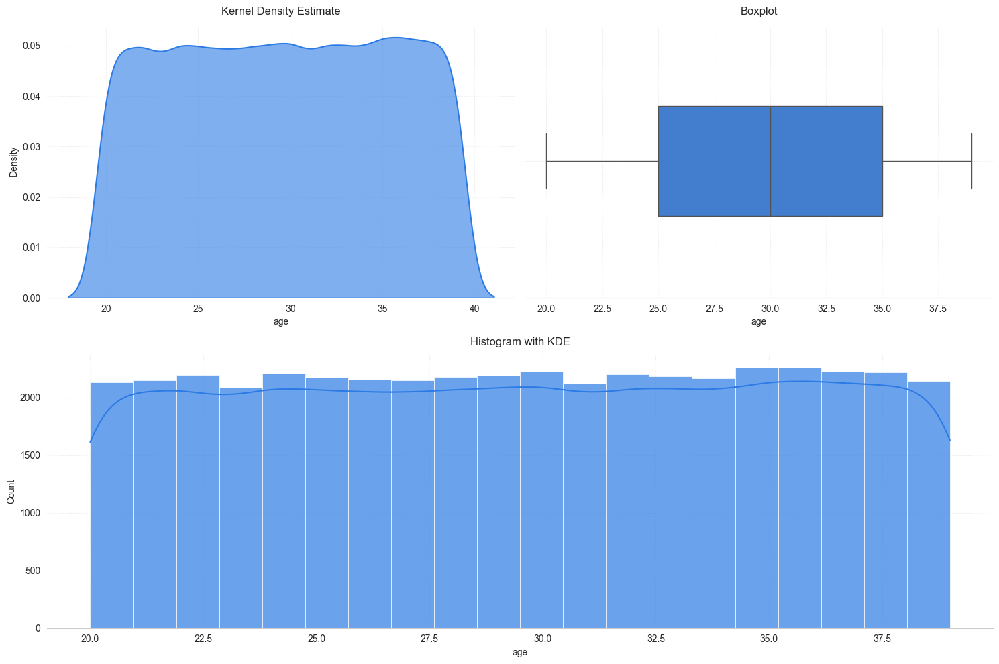

In [77]:
# numerical analysis for age
numerical_analysis(data, 'age', bins = 20)

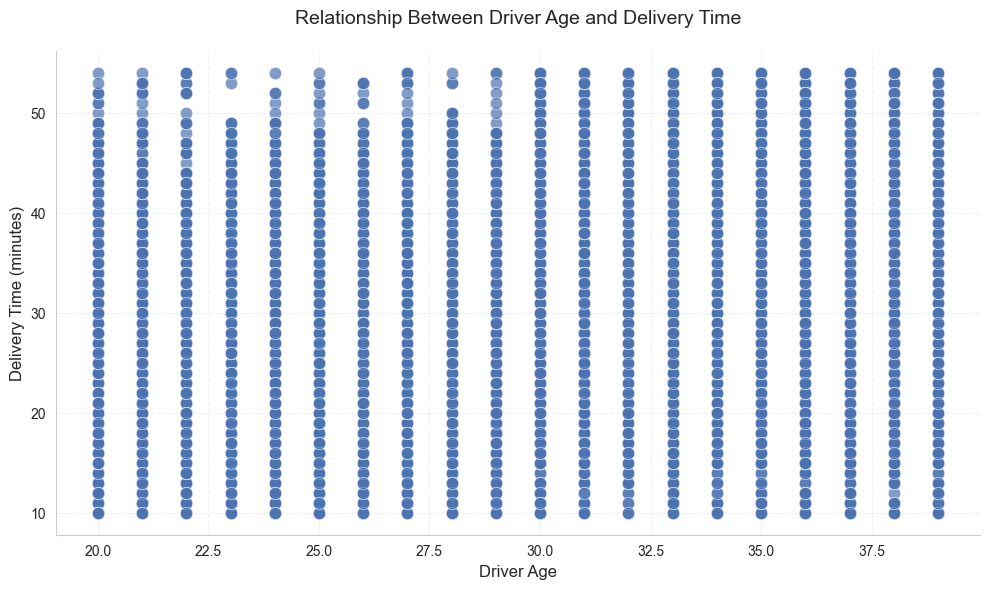

In [78]:
# relationship between target and age
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=data,
    x='age',
    y='time',
    color='#4C72B0',  # Attractive blue color
    alpha=0.7,       # Slight transparency
    edgecolor='w',   # White edges
    linewidth=0.5,   # Edge line width
    s=80            # Point size
)

# Add proper labels and title
plt.xlabel('Driver Age', fontsize=12)
plt.ylabel('Delivery Time (minutes)', fontsize=12)
plt.title('Relationship Between Driver Age and Delivery Time', fontsize=14, pad=20)

# Clean grid and layout
plt.grid(True, linestyle='--', alpha=0.3)
sns.despine()
plt.tight_layout()
plt.show()

Age of the rider does not show any impact on timetaken to deliver.

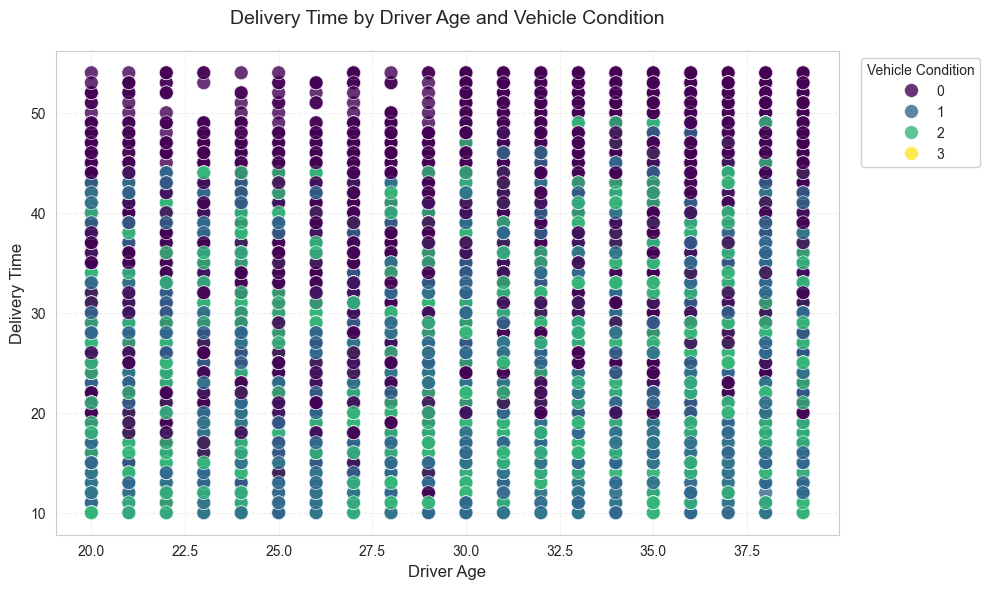

In [79]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=data,
    x='age',
    y='time',
    hue='vehicle_condition',
    palette='viridis',
    alpha=0.8,
    s=100,
    edgecolor='w',
    linewidth=0.5
)

plt.xlabel('Driver Age', fontsize=12)
plt.ylabel('Delivery Time', fontsize=12)
plt.title('Delivery Time by Driver Age and Vehicle Condition', fontsize=14, pad=20)

# Improved legend
plt.legend(
    title='Vehicle Condition',
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    frameon=True,
    framealpha=0.9
)

plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

<Axes: xlabel='vehical_type', ylabel='age'>

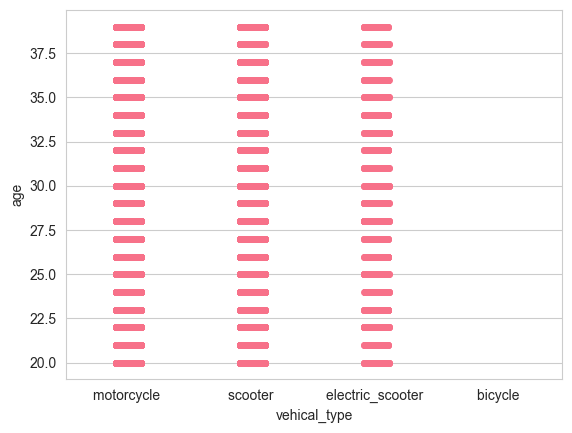

In [80]:
# preferences of vehicle type based on age
sns.stripplot(data, x = 'vehical_type', y = 'age')

### `Ratings`

In [81]:
data['ratings'].dtype

dtype('float64')

In [82]:
pd.DataFrame(data['ratings'].describe())

,ratings
count,43594.000000
mean,4.635287
std,0.313827
min,2.500000
25%,4.500000
50%,4.700000
75%,4.900000
max,5.000000


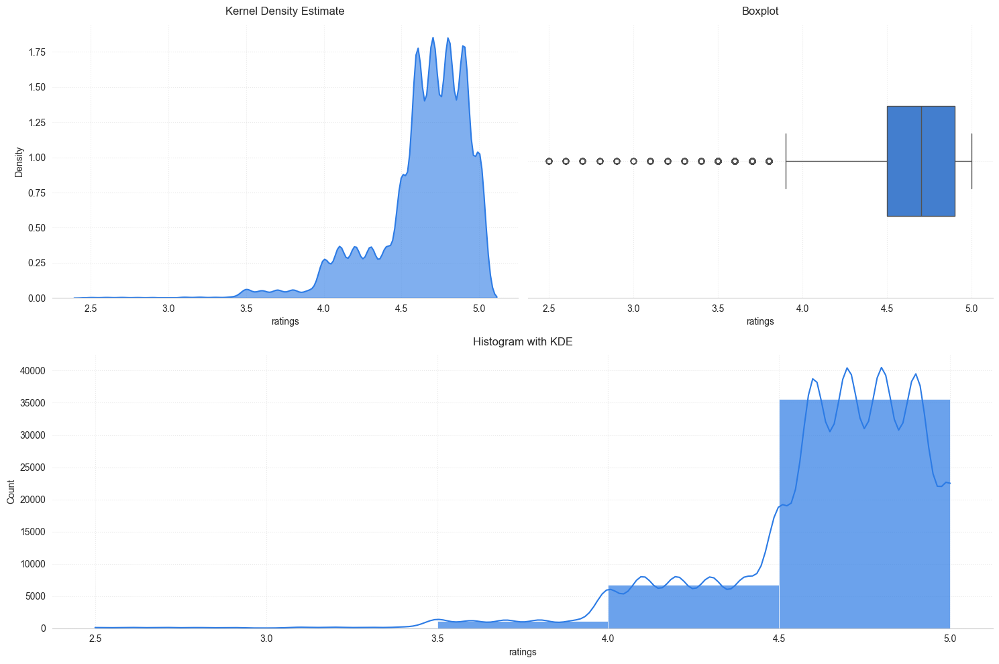

In [83]:
numerical_analysis(data, 'ratings', bins = 5)

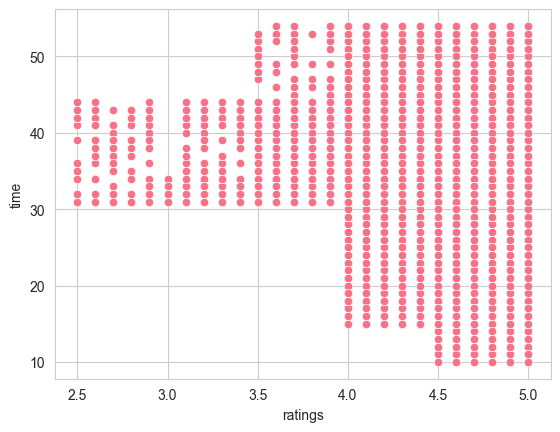

In [84]:
sns.scatterplot(data = data, x = 'ratings', y = 'time')
plt.show()

**Riders who have higher ratings tend to receive more orders.**

**A higher rating generally leads to increased work opportunities and greater potential earnings.**

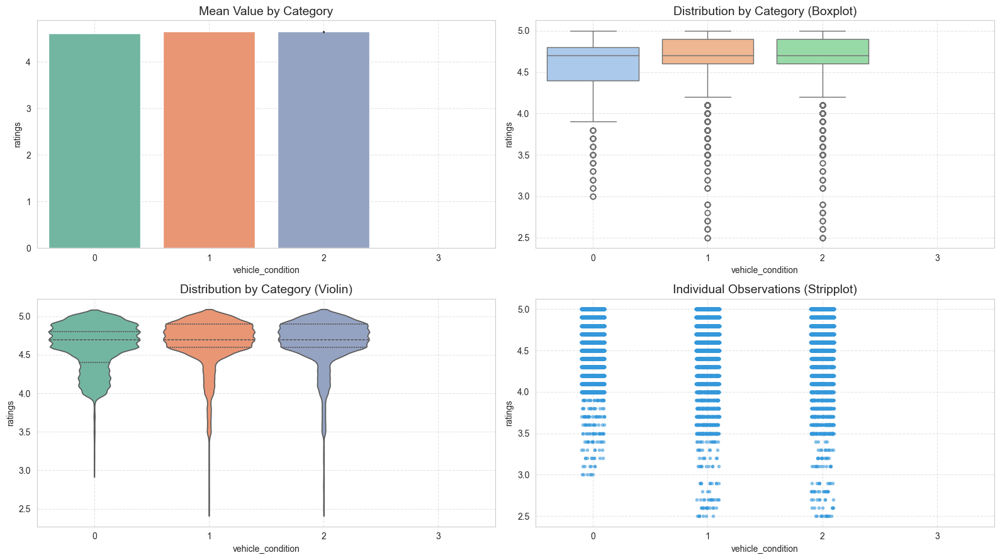

In [85]:
numerical_categorical_analysis(data, 'vehicle_condition', 'ratings')

**Yes, they do.**

- The poorer the condition of the vehicle, the lower the ratings tend to be.
- The absence of data in category 3 indicates the presence of NaN values.
- This suggests that when the vehicle is in bad condition, customers often choose not to rate their riders at all, even with a low score like 1.

In [86]:
pd.DataFrame(data[["ratings", "vehicle_condition"]]
    .loc[data["vehicle_condition"]== 3, "ratings"]
    .value_counts(dropna = False))

,count
ratings,
NaN,429


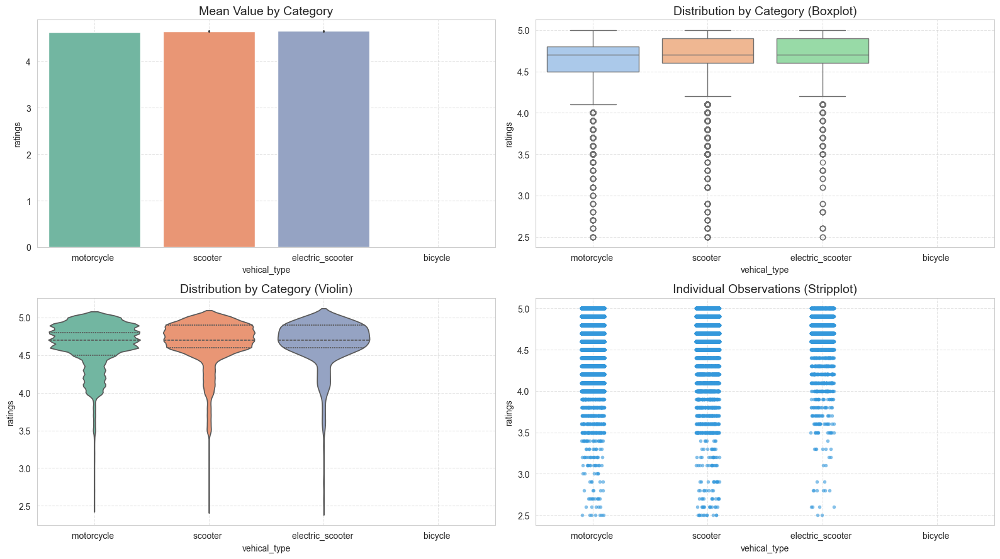

In [87]:
# does type of vehicle affects ratings
numerical_categorical_analysis(data, 'vehical_type', 'ratings')

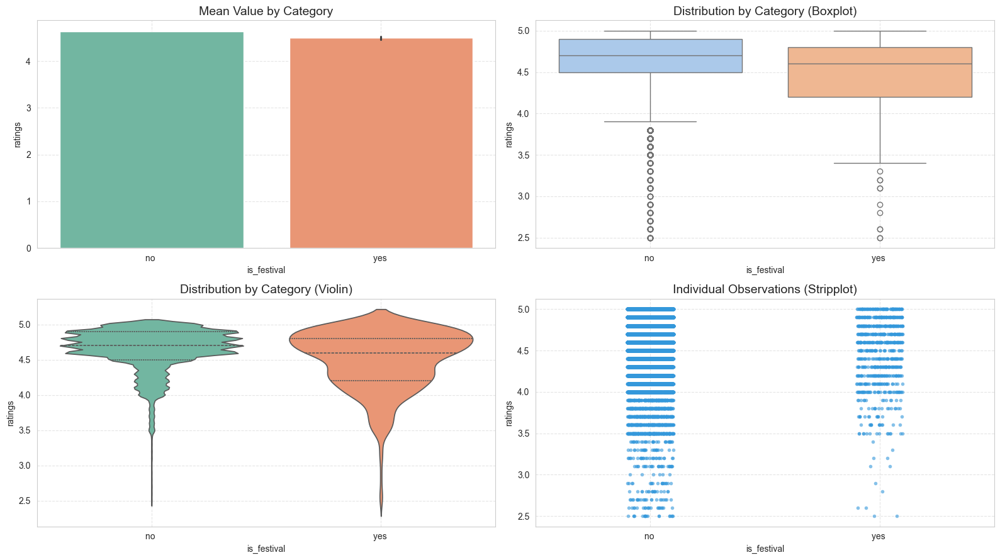

In [88]:
# festvals and rider ratings
numerical_categorical_analysis(data, 'is_festival', 'ratings')

### Location Based Features

In [89]:
data

,id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked,weather,traffic,vehicle_condition,order_type,vehical_type,multiple_deliveries,is_festival,city_category,time,city,day,month,year,day_of_week,is_weekend,order_time_hour,order_time_of_day,pickup_time,distance,distance_type,time_taken_pt
0,0x4607,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,2025-05-23 11:30:00,2025-05-23 11:45:00,sunny,high,2,snack,motorcycle,0.0,no,urban,24,INDO,19,3,2022,Saturday,1,11.0,morning,15.0,3.025149,short,-0.130153
1,0xb379,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,2025-05-23 19:45:00,2025-05-23 19:50:00,stormy,jam,2,snack,scooter,1.0,no,metropolitian,33,BANG,25,3,2022,Friday,0,19.0,evening,5.0,20.183530,very_long,0.775092
2,0x5d6d,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,2025-05-23 08:30:00,2025-05-23 08:45:00,sandstorms,low,0,drinks,motorcycle,1.0,no,urban,26,BANG,19,3,2022,Saturday,1,8.0,morning,15.0,1.552758,short,0.088493
3,0x7a6a,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,2025-05-23 18:00:00,2025-05-23 18:10:00,sunny,medium,0,buffet,motorcycle,1.0,no,metropolitian,21,COIMB,5,4,2022,Tuesday,0,18.0,evening,10.0,7.790401,medium,-0.482135
4,0x70a2,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,2025-05-23 13:30:00,2025-05-23 13:45:00,cloudy,high,1,snack,scooter,1.0,no,metropolitian,30,CHEN,26,3,2022,Saturday,1,13.0,afternoon,15.0,6.210138,medium,0.494134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45497,0x7c09,30.0,4.8,26.902328,75.794257,26.912328,75.804257,2022-03-24,2025-05-23 11:35:00,2025-05-23 11:45:00,windy,high,1,meal,motorcycle,0.0,no,metropolitian,32,JAP,24,3,2022,Thursday,0,11.0,morning,10.0,1.489846,short,0.683422
45498,0xd641,21.0,4.6,NaN,NaN,NaN,NaN,2022-02-16,2025-05-23 19:55:00,2025-05-23 20:10:00,windy,jam,0,buffet,motorcycle,1.0,no,metropolitian,36,AGR,16,2,2022,Wednesday,0,19.0,evening,15.0,NaN,NaN,1.039335
45499,0x4f8d,30.0,4.9,13.022394,80.242439,13.052394,80.272439,2022-03-11,2025-05-23 23:50:00,2025-05-23 00:05:00,cloudy,low,1,drinks,scooter,0.0,no,metropolitian,16,CHEN,11,3,2022,Friday,0,23.0,night,-1425.0,4.657195,short,-1.151494
45500,0x5eee,20.0,4.7,11.001753,76.986241,11.041753,77.026241,2022-03-07,2025-05-23 13:35:00,2025-05-23 13:40:00,cloudy,high,0,snack,motorcycle,1.0,no,metropolitian,26,COIMB,7,3,2022,Monday,0,13.0,afternoon,5.0,6.232393,medium,0.088493


In [91]:
data.columns[3:7].tolist() + ["city"]

['restaurant_latitude',
 'restaurant_longitude',
 'delivery_latitude',
 'delivery_longitude',
 'city']

In [97]:
# location subset
location_subset = data.loc[:,data.columns[3:7].tolist() + ["city"]]
location_subset.head(5)

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,city
0,22.745049,75.892471,22.765049,75.912471,INDO
1,12.913041,77.683237,13.043041,77.813237,BANG
2,12.914264,77.678400,12.924264,77.688400,BANG
3,11.003669,76.976494,11.053669,77.026494,COIMB
4,12.972793,80.249982,13.012793,80.289982,CHEN


In [93]:
pd.DataFrame(location_subset.dtypes)

,0
restaurant_latitude,float64
restaurant_longitude,float64
delivery_latitude,float64
delivery_longitude,float64
city,object


In [96]:
# drop missing values

location_subset.dropna(inplace=True)
location_subset.head(5)

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,city
0,22.745049,75.892471,22.765049,75.912471,INDO
1,12.913041,77.683237,13.043041,77.813237,BANG
2,12.914264,77.678400,12.924264,77.688400,BANG
3,11.003669,76.976494,11.053669,77.026494,COIMB
4,12.972793,80.249982,13.012793,80.289982,CHEN


In [98]:
# plot deliveries on map
delivery_df = pd.DataFrame({
    'latitude': location_subset['delivery_latitude'],
    'longitude': location_subset['delivery_longitude'],
    "city": location_subset["city"]
})


# Create a map using Plotly's scatter_mapbox
fig = px.scatter_mapbox(
    delivery_df,
    lat='latitude',
    lon='longitude',
    title="Delivery Points",
    hover_name="city"
)

# Update the layout for the map of India
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 20.5937, "lon": 78.9629},  # Centered over India
    mapbox_zoom=3,
)

# Show the plot
fig.show()

### Order Date

In [99]:
data.columns

Index(['id', 'age', 'ratings', 'restaurant_latitude', 'restaurant_longitude',
       'delivery_latitude', 'delivery_longitude', 'order_date', 'order_time',
       'order_picked', 'weather', 'traffic', 'vehicle_condition', 'order_type',
       'vehical_type', 'multiple_deliveries', 'is_festival', 'city_category',
       'time', 'city', 'day', 'month', 'year', 'day_of_week', 'is_weekend',
       'order_time_hour', 'order_time_of_day', 'pickup_time', 'distance',
       'distance_type', 'time_taken_pt'],
      dtype='object')

In [100]:
data.filter(like = "order").sample(5)

,order_date,order_time,order_picked,order_type,order_time_hour,order_time_of_day
34576,2022-03-20,2025-05-23 21:35:00,2025-05-23 21:50:00,snack,21.0,night
6791,2022-03-27,2025-05-23 18:10:00,2025-05-23 18:15:00,snack,18.0,evening
213,2022-03-29,2025-05-23 18:15:00,2025-05-23 18:30:00,buffet,18.0,evening
31382,2022-03-25,2025-05-23 22:25:00,2025-05-23 22:30:00,drinks,22.0,night
43765,2022-03-03,2025-05-23 20:30:00,2025-05-23 20:45:00,buffet,20.0,night


In [103]:
order_date_subset = data.loc[:,["order_date", "day", "month", "day_of_week", "is_weekend", "is_festival"]]
order_date_subset.sample(5)

,order_date,day,month,day_of_week,is_weekend,is_festival
16796,2022-03-02,2,3,Wednesday,0,yes
12147,2022-02-17,17,2,Thursday,0,no
33556,2022-03-19,19,3,Saturday,1,no
36611,2022-03-12,12,3,Saturday,1,no
33101,2022-03-05,5,3,Saturday,1,no


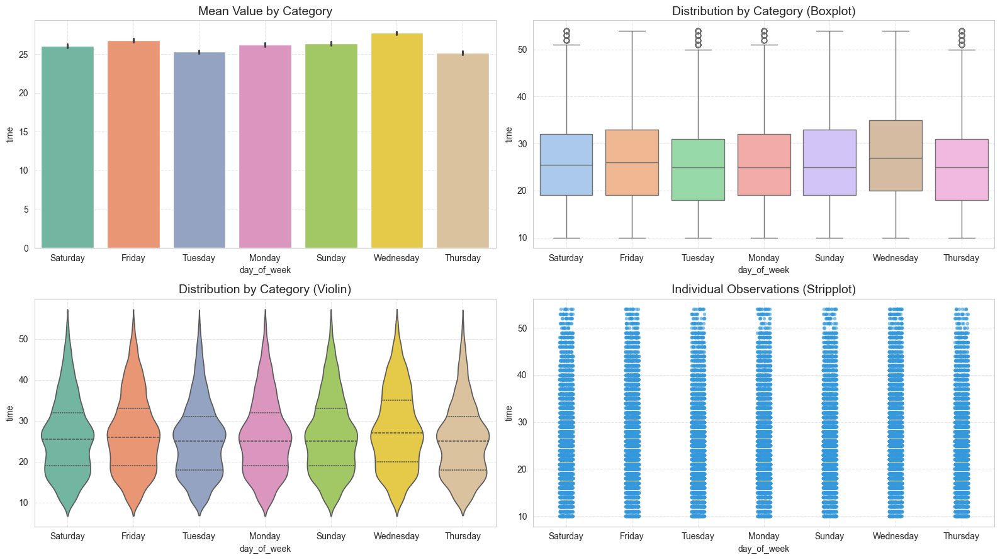

In [105]:
# analysis between day of week and target
numerical_categorical_analysis(data, "day_of_week", "time")

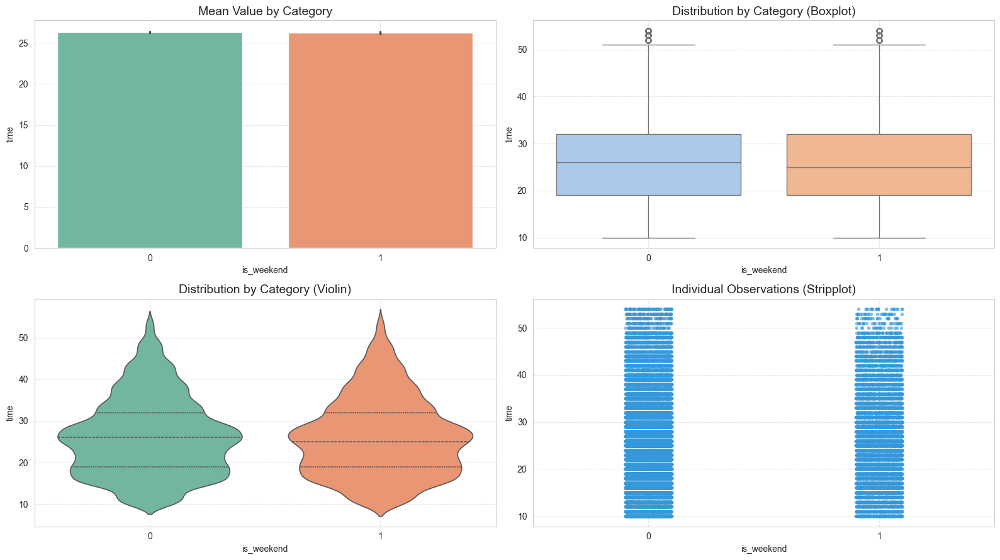

In [106]:
# does having a weekend affects target
numerical_categorical_analysis(data, "is_weekend", "time")

In [107]:
# do weekends have an impact on traffic
chi_2_test(data, "is_weekend", "traffic")


Contingency Table between 'is_weekend' and 'traffic':


traffic,high,jam,low,medium
is_weekend,,,,
0,3237,10240,11185,7949
1,1188,3903,4292,2998


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 1.4899
Degrees of Freedom: 3
P-value: 0.6846
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant association between 'is_weekend' and 'traffic'.


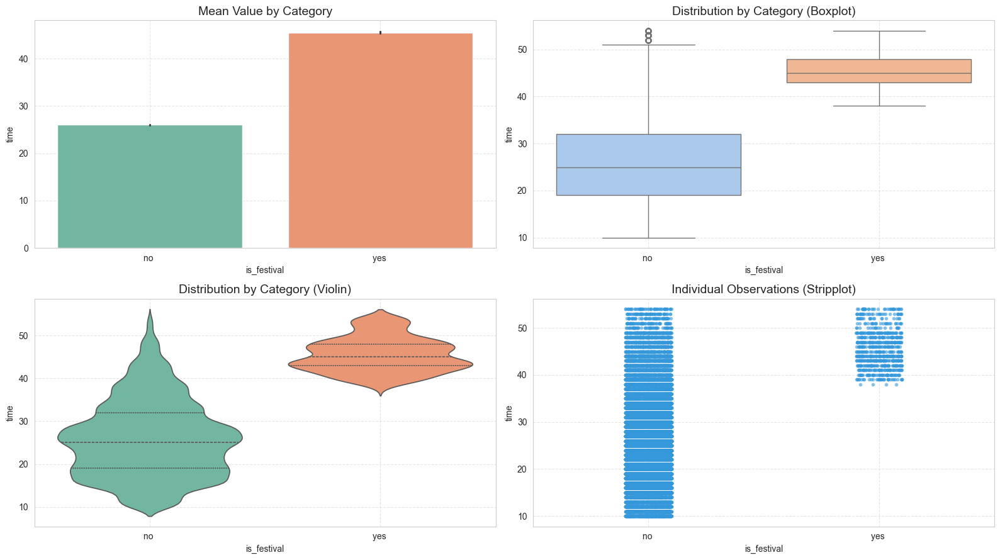

In [108]:
# festivals and target analysis
numerical_categorical_analysis(data, "is_festival", "time")

### Observations
- The average delivery time varies during festivals.
- The range of delivery times is narrower with less variation during festivals, indicating that deliveries generally take longer in this period.

In [109]:
# do festival affect traffic
chi_2_test(data, "is_festival", "traffic")


Contingency Table between 'is_festival' and 'traffic':


traffic,high,jam,low,medium
is_festival,,,,
no,4338,13473,15299,10778
yes,69,630,50,130


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 710.4774
Degrees of Freedom: 3
P-value: 1.122e-153
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant association between 'is_festival' and 'traffic'.


The p value is very small which mans it does affect traffic.

In [110]:
data.pivot_table(index = "traffic", columns = "is_festival", values = "time" , aggfunc = "mean")

is_festival,no,yes
traffic,,
high,27.010373,45.826087
jam,30.538039,46.093651
low,21.284332,42.020000
medium,26.550288,43.715385


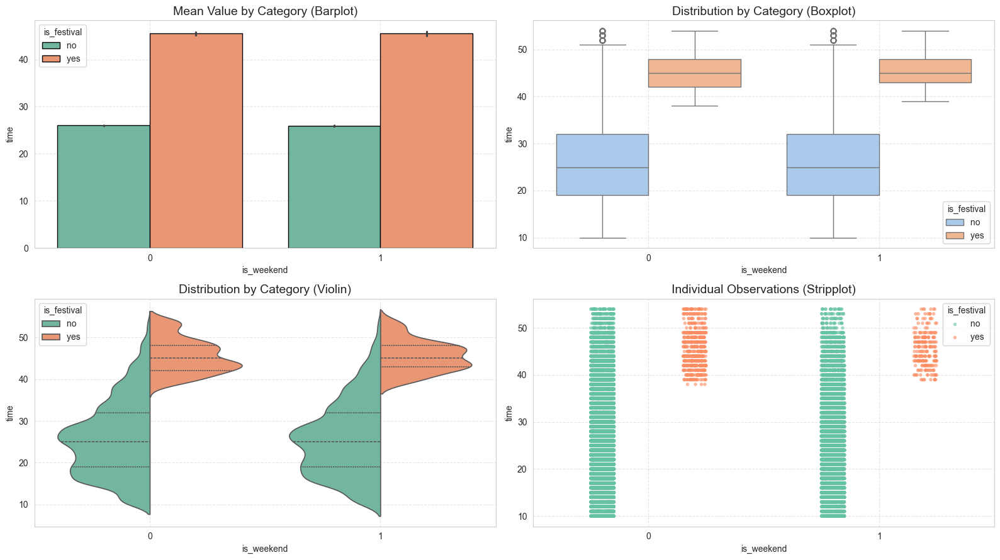

In [111]:
# does a weekend and a festival combined have an effect on delivery times
multivariate_analysis(data, "time", "is_weekend", "is_festival")

### Order Time

In [113]:
data.sample()

,id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked,weather,traffic,vehicle_condition,order_type,vehical_type,multiple_deliveries,is_festival,city_category,time,city,day,month,year,day_of_week,is_weekend,order_time_hour,order_time_of_day,pickup_time,distance,distance_type,time_taken_pt
27030,0x5e83,34.0,4.7,26.846156,75.8023,26.976156,75.9323,2022-03-29,2025-05-23 22:10:00,2025-05-23 22:15:00,windy,low,0,drinks,motorcycle,0.0,no,metropolitian,21,JAP,29,3,2022,Tuesday,0,22.0,night,5.0,19.367702,very_long,-0.482135


In [114]:
# time related columns

time_subset = data.loc[:,["order_time_hour","order_time_of_day","pickup_time"]]
time_subset.sample(5)

,order_time_hour,order_time_of_day,pickup_time
13905,22.0,night,5.0
37553,11.0,morning,5.0
112,23.0,night,5.0
36551,20.0,night,10.0
9713,NaN,after_midnight,NaN


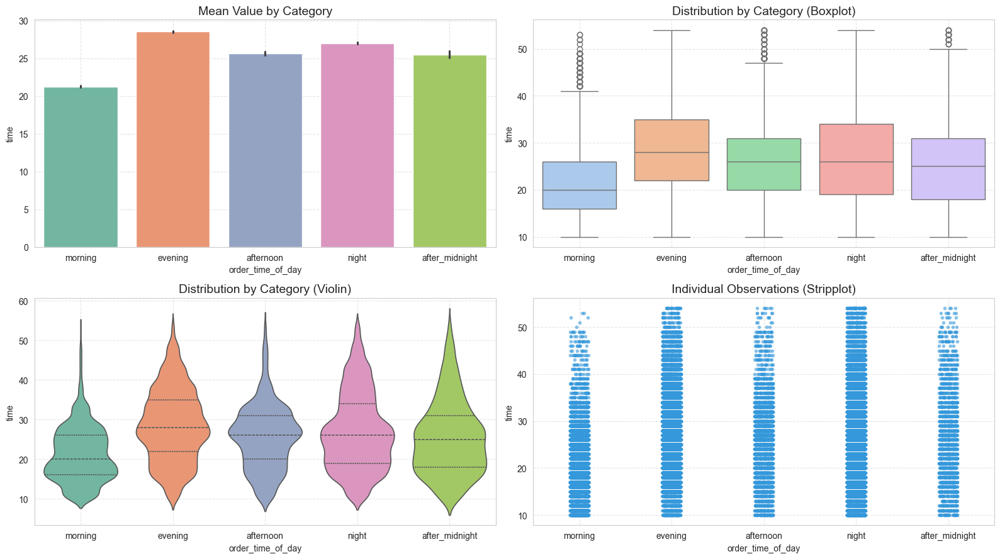

In [115]:
# does time of day affects delivery times

numerical_categorical_analysis(data, "order_time_of_day", "time")

In [116]:
# relationship between time of day and traffic

chi_2_test(data, "order_time_of_day", "traffic")


Contingency Table between 'order_time_of_day' and 'traffic':


traffic,high,jam,low,medium
order_time_of_day,,,,
after_midnight,103,343,845,269
afternoon,2553,0,0,1496
evening,0,4171,0,9182
morning,1769,0,5949,0
night,0,9629,8683,0


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 51100.6095
Degrees of Freedom: 12
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant association between 'order_time_of_day' and 'traffic'.


In [117]:
# anova test
anova_test(data, "time", "order_time_of_day")

ANOVA Results for 'time' by 'order_time_of_day':
F-statistic: 834.7126
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'order_time_of_day'.


In [118]:
# Top 5 times(hrs) of the day in which customers  order the most
pd.DataFrame(data["order_time_hour"].value_counts().head(5))

,count
order_time_hour,
21.0,4686
19.0,4595
22.0,4576
20.0,4539
23.0,4511


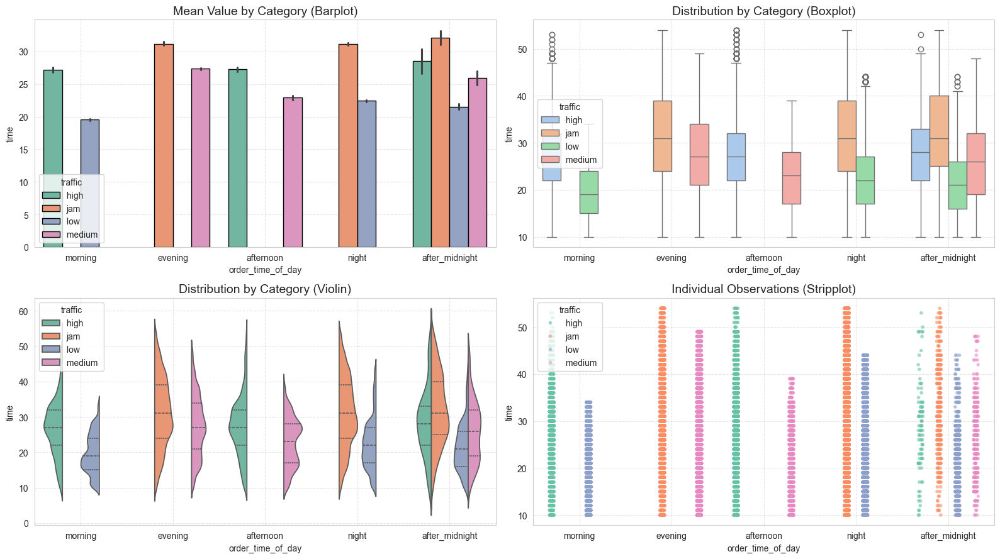

In [119]:
# can delivery time be affected by both time of day and traffic
multivariate_analysis(data, "time", "order_time_of_day", "traffic")

,Count,Percentage
order_time_hour,,
21.0,4686,10.68%
19.0,4595,10.48%
22.0,4576,10.43%
20.0,4539,10.35%
23.0,4511,10.28%
18.0,4480,10.21%
17.0,4278,9.75%
10.0,1991,4.54%
11.0,1962,4.47%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in order_time_hour column are [11.0, 19.0, 8.0, 18.0, 13.0, 21.0, 17.0, 20.0, 14.0, 9.0, 22.0, 12.0, 23.0, nan, 10.0, 16.0, 15.0, 0.0]
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in order_time_hour column are 17


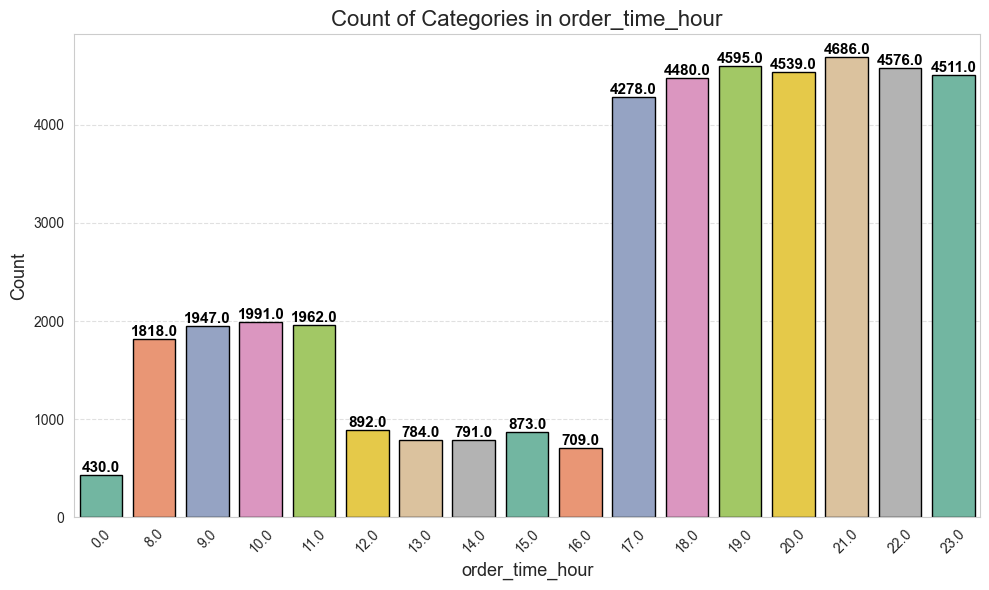

In [120]:
# categorical analysis on order_time_hour
categorical_analysis(data, "order_time_hour")

,Count,Percentage
order_time_of_day,,
night,18312,40.24%
evening,13353,29.35%
morning,7718,16.96%
afternoon,4049,8.9%
after_midnight,2070,4.55%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in order_time_of_day column are ['morning', 'evening', 'afternoon', 'night', 'after_midnight']
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in order_time_of_day column are 5


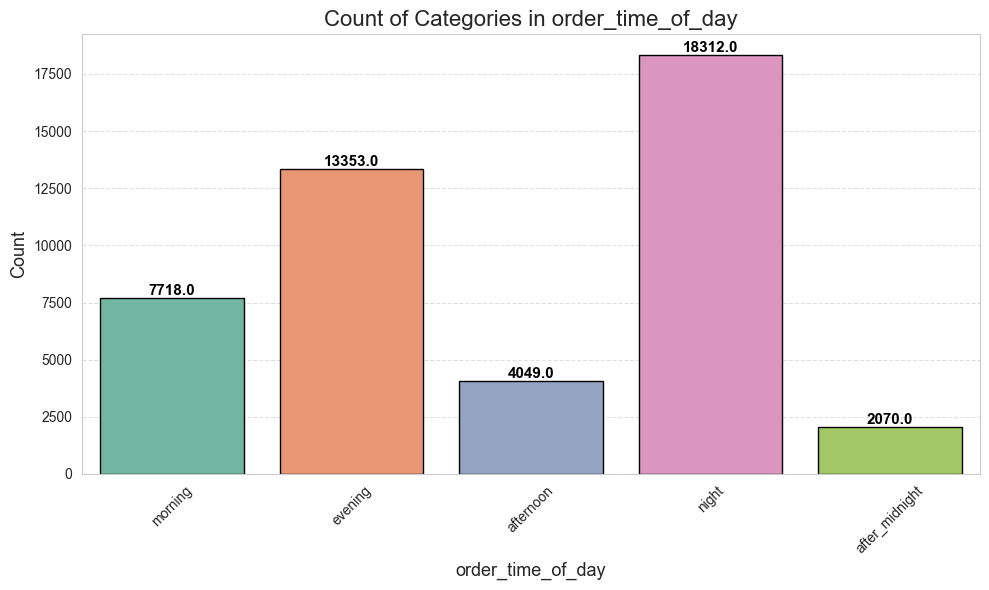

In [121]:
# categorical analysis on time of day
categorical_analysis(data, "order_time_of_day")

### Pickup Time

In [123]:
# pickup_time datatype
data['pickup_time'].dtype

dtype('float64')

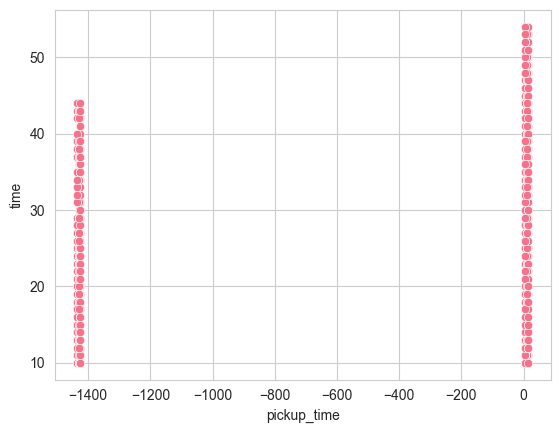

In [125]:
# relationship between pickup time and delivery time

sns.scatterplot(data, x = "pickup_time", y = "time")
plt.show()

,Count,Percentage
pickup_time,,
5.0,14564,33.2%
10.0,14288,32.57%
15.0,14179,32.33%
-1425.0,431,0.98%
-1430.0,261,0.6%
-1435.0,139,0.32%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in pickup_time column are [15.0, 5.0, 10.0, nan, -1425.0, -1430.0, -1435.0]
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in pickup_time column are 6


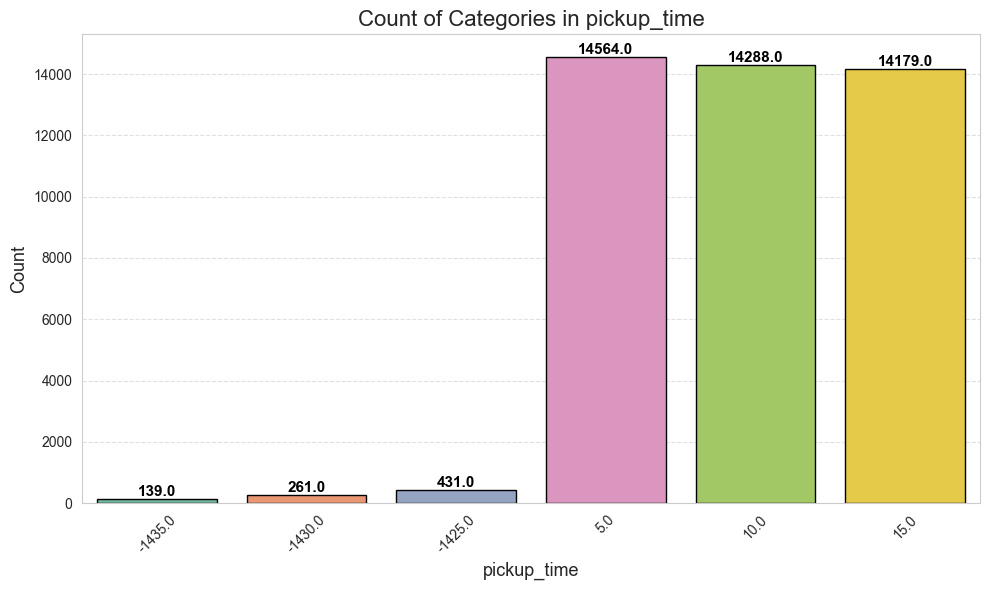

In [129]:
# pickup time categorical analysis

categorical_analysis(data, "pickup_time")

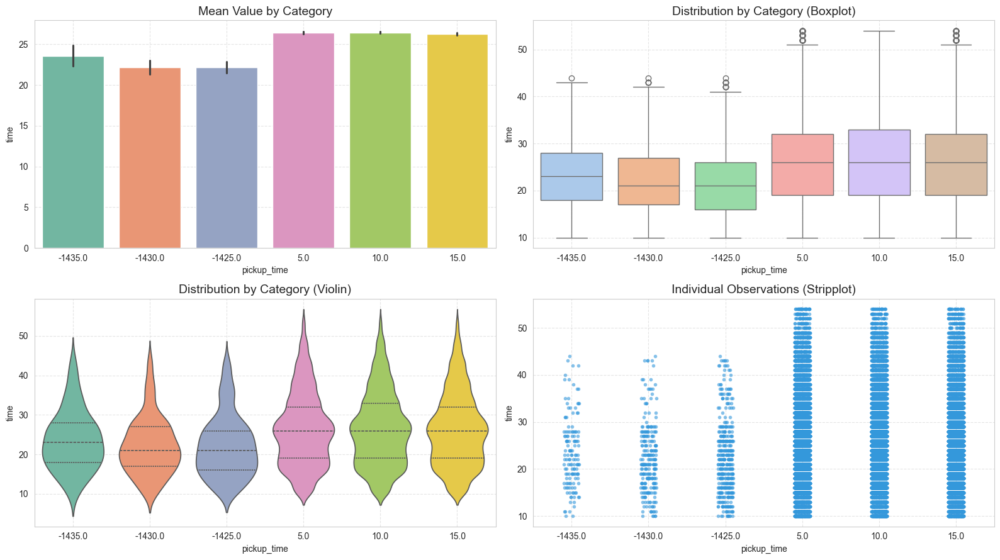

In [130]:
# does pickup time have an effect on delivery time
numerical_categorical_analysis(data, "pickup_time", "time")

In [132]:
# hypothesis testing to prove point
anova_test(data, "time", "pickup_time")

ANOVA Results for 'time' by 'pickup_time':
F-statistic: 30.6608
P-value: 3.005e-31
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'pickup_time'.


### Traffic

In [133]:
# datatype of traffic column
data['traffic'].dtype

dtype('O')

,Count,Percentage
traffic,,
low,15477,34.4%
jam,14143,31.43%
medium,10947,24.33%
high,4425,9.84%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in traffic column are ['high ', 'jam ', 'low ', 'medium ', nan]
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in traffic column are 4


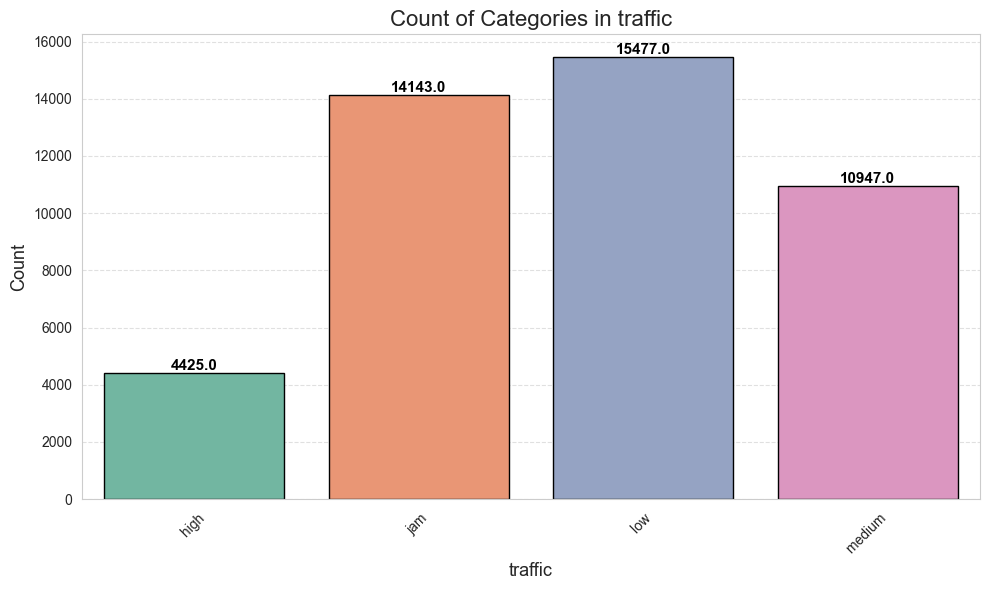

In [134]:
# categorical analysis on traffic
categorical_analysis(data, "traffic")

In [135]:
# does traffic depends on type of city
chi_2_test(data, "traffic", "city")


Contingency Table between 'traffic' and 'city':


city,AGR,ALH,AURG,BANG,BHP,CHEN,COIMB,DEH,GOA,HYD,INDO,JAP,KNP,KOC,KOL,LUDH,MUM,MYS,PUNE,RANCHI,SUR,VAD
traffic,,,,,,,,,,,,,,,,,,,,,,
high,64,71,82,297,72,312,300,73,69,334,308,297,56,68,67,64,326,314,308,327,312,304
jam,265,229,215,983,212,999,971,232,207,961,970,1120,233,223,217,266,928,967,974,977,997,997
low,257,227,241,1114,244,1052,1090,247,244,1053,1082,1138,263,246,226,247,1105,1054,1061,1076,1101,1109
medium,170,204,161,745,156,731,766,175,183,795,757,852,181,158,181,178,766,786,745,801,740,716


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 62.3959
Degrees of Freedom: 63
P-value: 0.4978
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant association between 'traffic' and 'city'.


In [136]:
# does traffic depends on city
chi_2_test(data, "traffic", "city")


Contingency Table between 'traffic' and 'city':


city,AGR,ALH,AURG,BANG,BHP,CHEN,COIMB,DEH,GOA,HYD,INDO,JAP,KNP,KOC,KOL,LUDH,MUM,MYS,PUNE,RANCHI,SUR,VAD
traffic,,,,,,,,,,,,,,,,,,,,,,
high,64,71,82,297,72,312,300,73,69,334,308,297,56,68,67,64,326,314,308,327,312,304
jam,265,229,215,983,212,999,971,232,207,961,970,1120,233,223,217,266,928,967,974,977,997,997
low,257,227,241,1114,244,1052,1090,247,244,1053,1082,1138,263,246,226,247,1105,1054,1061,1076,1101,1109
medium,170,204,161,745,156,731,766,175,183,795,757,852,181,158,181,178,766,786,745,801,740,716


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 62.3959
Degrees of Freedom: 63
P-value: 0.4978
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant association between 'traffic' and 'city'.


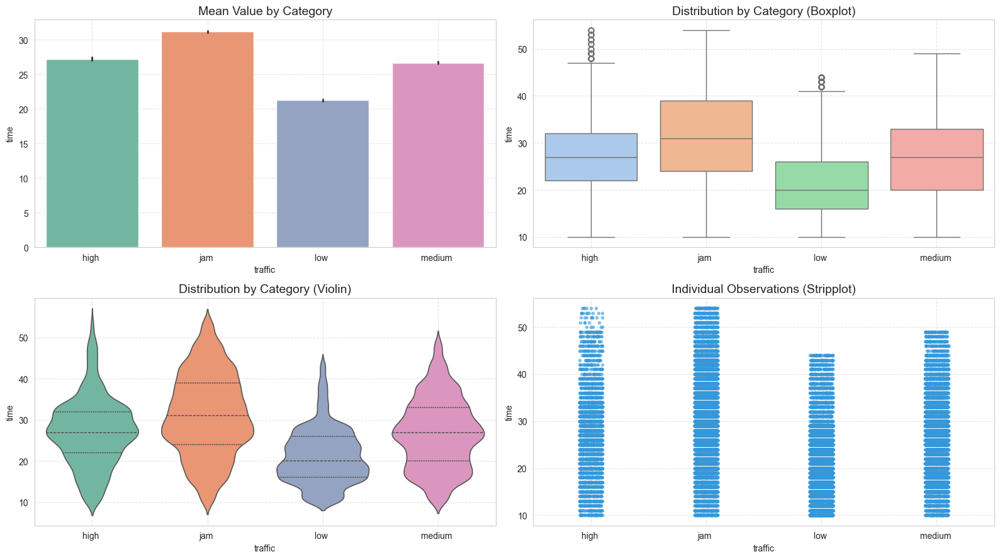

In [137]:
# does traffic affects delivery times
numerical_categorical_analysis(data, "traffic", "time")

In [138]:
# hypothesis test on does traffic affects delivery times
anova_test(data, "time", "traffic")

ANOVA Results for 'time' by 'traffic':
F-statistic: 3411.2667
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'traffic'.


In [140]:
data.sample()

,id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked,weather,traffic,vehicle_condition,order_type,vehical_type,multiple_deliveries,is_festival,city_category,time,city,day,month,year,day_of_week,is_weekend,order_time_hour,order_time_of_day,pickup_time,distance,distance_type,time_taken_pt
35542,0x5068,27.0,4.9,13.086438,80.220672,13.156439,80.290672,2022-03-14,2025-05-23 23:50:00,2025-05-23 00:05:00,sandstorms,low,2,snack,electric_scooter,1.0,no,metropolitian,14,CHEN,14,3,2022,Monday,0,23.0,night,-1425.0,10.865066,long,-1.457874


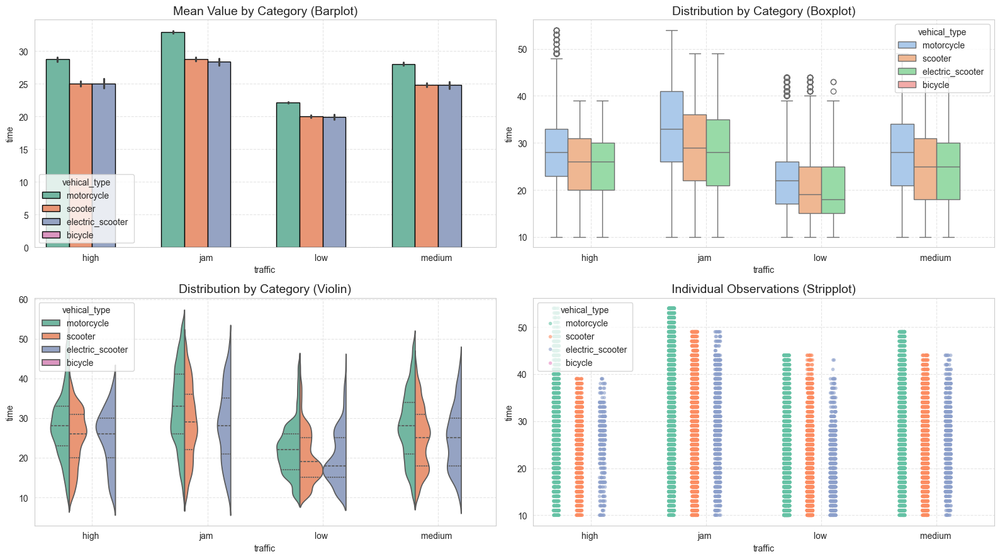

In [141]:
# are some vehicle types more suitable in traffic than others
multivariate_analysis(data, "time", "traffic", "vehical_type")

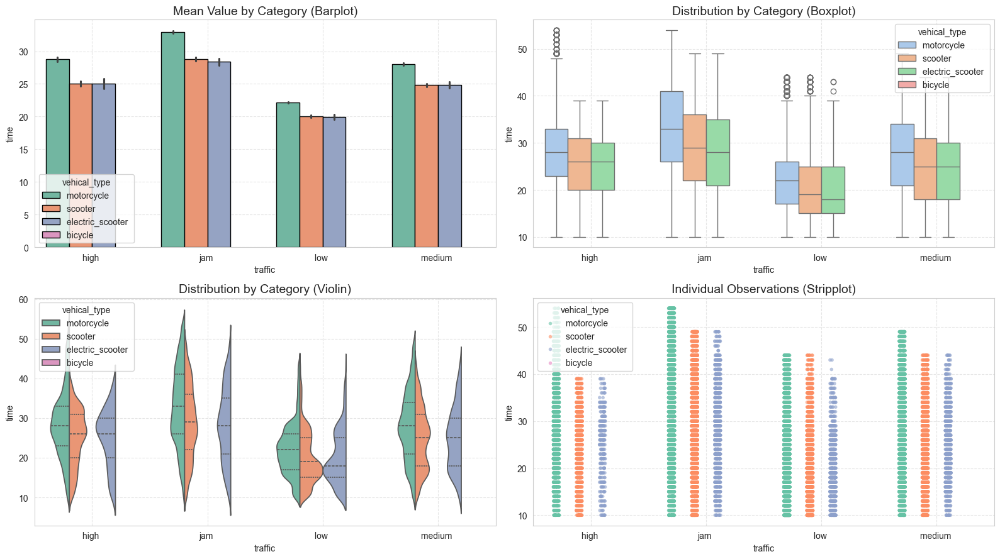

In [143]:
# does vehicle condition in traffic situations affects delivery times
multivariate_analysis(data, "time", "traffic", "vehical_type")

In [ ]:
multivariate_analysis(data, "time", "is_festival", "vehicle_type")

### Multiple Deliveries

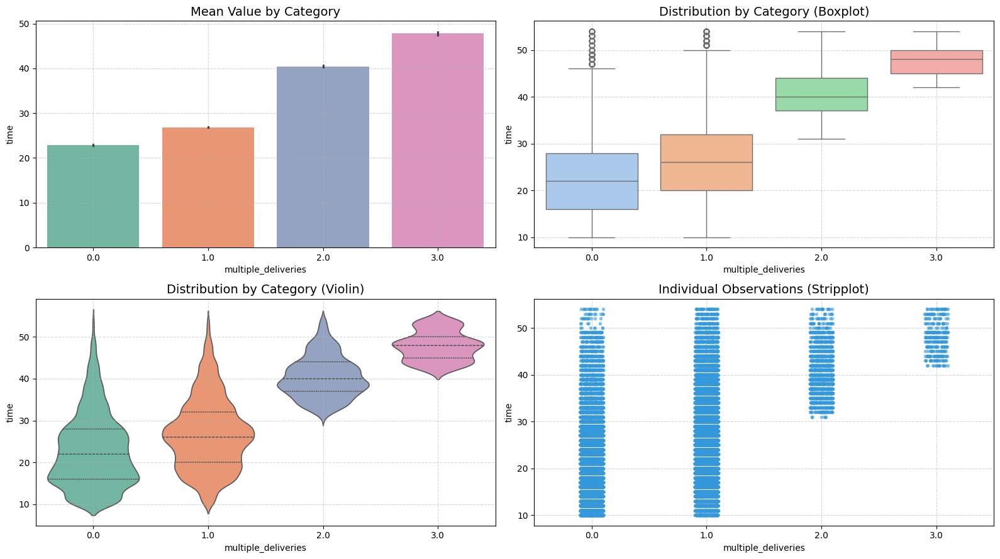

In [78]:
# does multiple delivereis affect delivery times
numerical_categorical_analysis(data, "multiple_deliveries", "time")

In [144]:
# hypothesis test
anova_test(data, "time", "multiple_deliveries")

ANOVA Results for 'time' by 'multiple_deliveries':
F-statistic: 3438.7922
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'multiple_deliveries'.


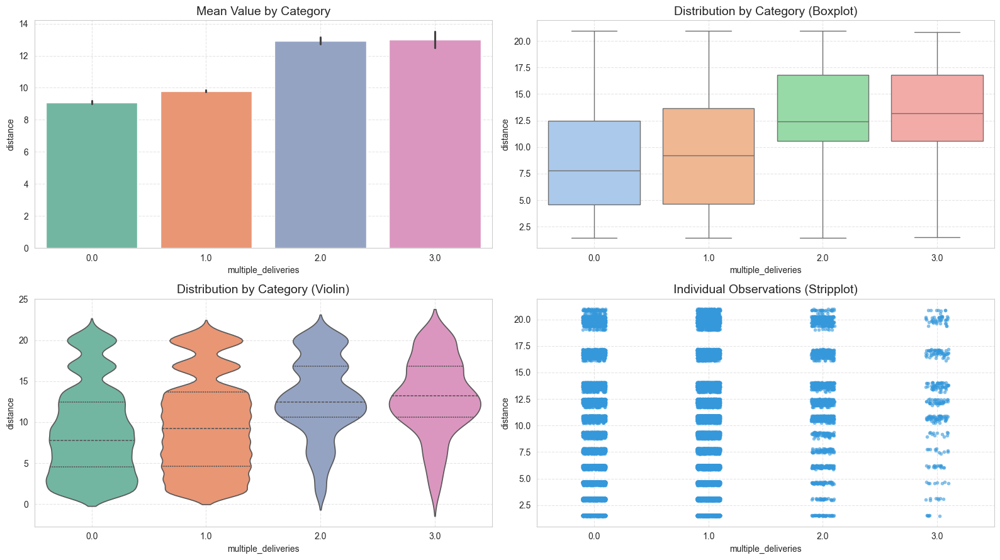

In [145]:
# do multiple deliveries are of longer distances
numerical_categorical_analysis(data, "multiple_deliveries", "distance")

### Weather

In [146]:
# data type of weather column
data['weather'].dtype

dtype('O')

,Count,Percentage
weather,,
fog,7654,17.02%
stormy,7586,16.87%
cloudy,7536,16.76%
sandstorms,7495,16.66%
windy,7422,16.5%
sunny,7284,16.19%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in weather column are ['sunny', 'stormy', 'sandstorms', 'cloudy', 'fog', 'windy', nan]
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in weather column are 6


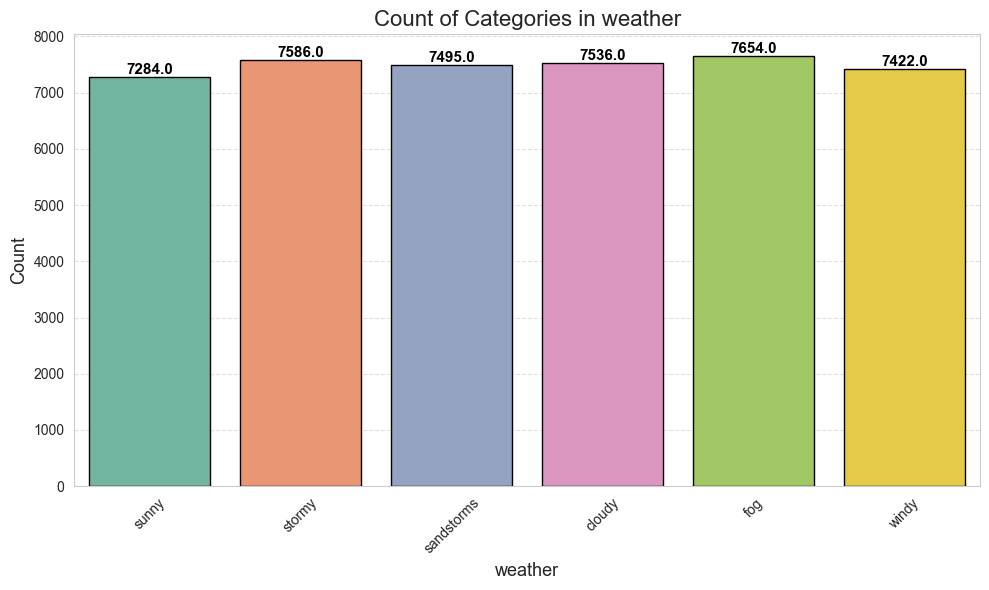

In [147]:
# categorical analysis on type of weather
categorical_analysis(data, "weather")

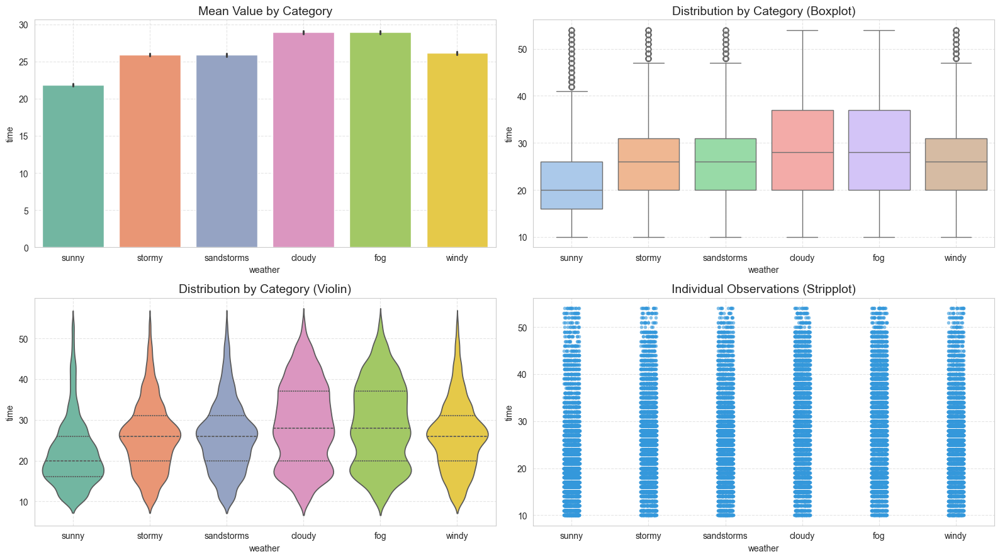

In [148]:
# does weather affect delivery times
numerical_categorical_analysis(data, "weather", "time")

In [149]:
# hypothesis test
anova_test(data, "time", "weather")

ANOVA Results for 'time' by 'weather':
F-statistic: 608.2196
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'weather'.


In [150]:
# does the weather affects traffic
chi_2_test(data, "weather", "traffic")


Contingency Table between 'weather' and 'traffic':


traffic,high,jam,low,medium
weather,,,,
cloudy,744,2349,2605,1838
fog,776,2429,2597,1852
sandstorms,701,2399,2609,1786
stormy,733,2323,2699,1831
sunny,735,2289,2475,1785
windy,735,2351,2484,1852


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 14.6130
Degrees of Freedom: 15
P-value: 0.4796
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant association between 'weather' and 'traffic'.


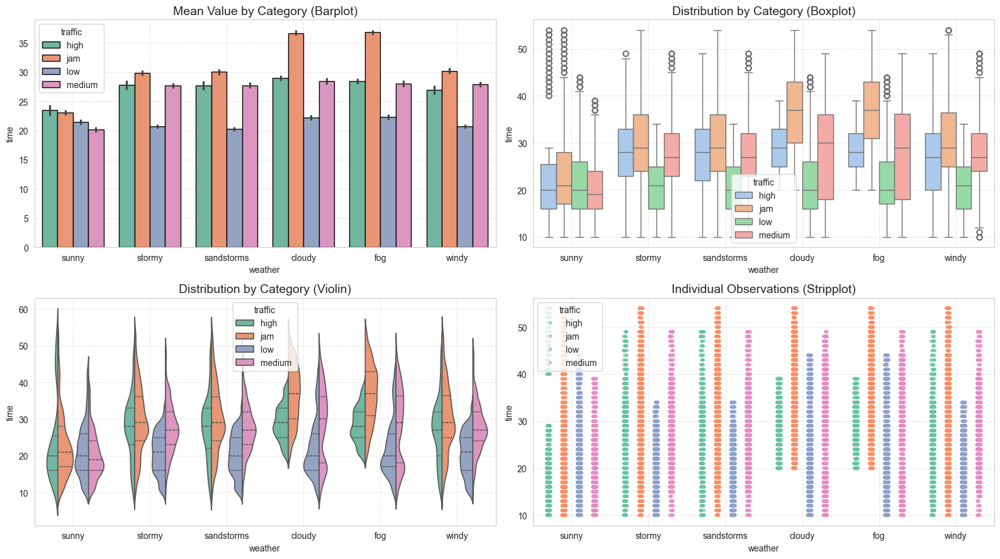

In [151]:
# delivery times based on weather and traffic
multivariate_analysis(data, "time", "weather", "traffic")

Seems like traffic along with other features combined acts as great discriminatory feature

In [152]:
# pivot table
data.pivot_table(index = "weather", columns = "traffic", values = "time", aggfunc = "mean")

traffic,high,jam,low,medium
weather,,,,
cloudy,28.940860,36.689655,22.208445,28.483134
fog,28.426546,36.806916,22.303427,28.044816
sandstorms,27.711840,30.018758,20.297049,27.738522
stormy,27.845839,29.850194,20.681734,27.680502
sunny,23.448980,23.082132,21.449293,20.195518
windy,26.972789,30.219056,20.665862,27.888769


### Vehicle - Condition and Type

,Count,Percentage
vehicle_condition,,
2,15034,33.04%
1,15030,33.03%
0,15009,32.99%
3,429,0.94%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in vehicle_condition column are [2, 0, 1, 3]
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in vehicle_condition column are 4


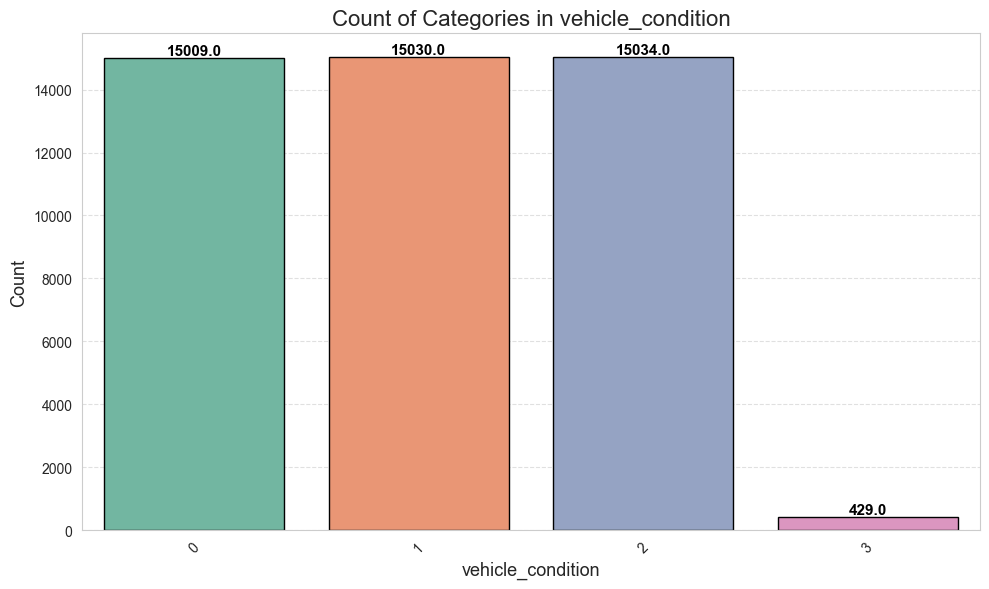

In [153]:
# categorical analysis on vehicle condition
categorical_analysis(data, "vehicle_condition")

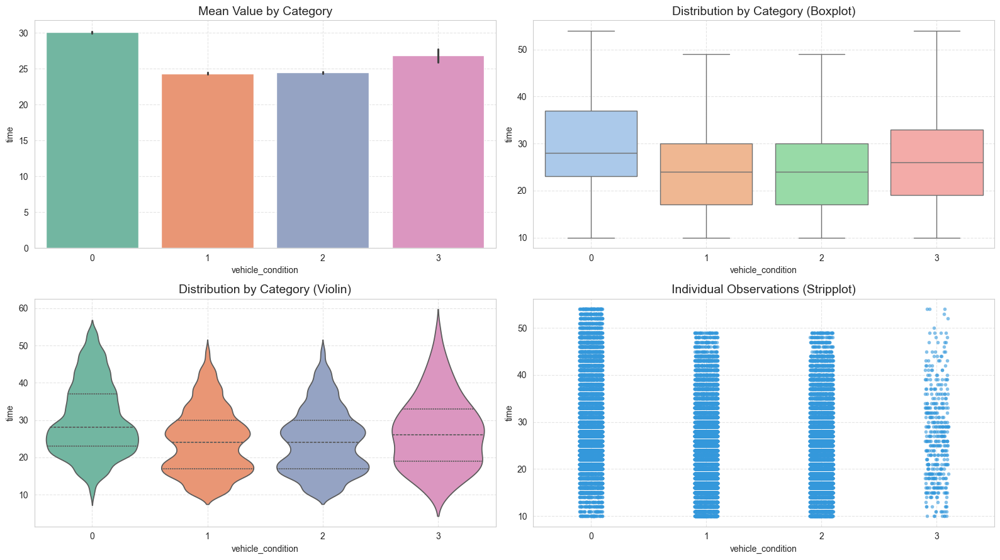

In [154]:
# does vehicle condition affect delivery times
numerical_categorical_analysis(data, "vehicle_condition", "time")

In [158]:
# anova test
anova_test(data, "time", "vehicle_condition")

ANOVA Results for 'time' by 'vehicle_condition':
F-statistic: 1323.2530
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'vehicle_condition'.


,Count,Percentage
vehical_type,,
motorcycle,26427,58.08%
scooter,15244,33.5%
electric_scooter,3778,8.3%
bicycle,53,0.12%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in vehical_type column are ['motorcycle ', 'scooter ', 'electric_scooter ', 'bicycle ']
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in vehical_type column are 4


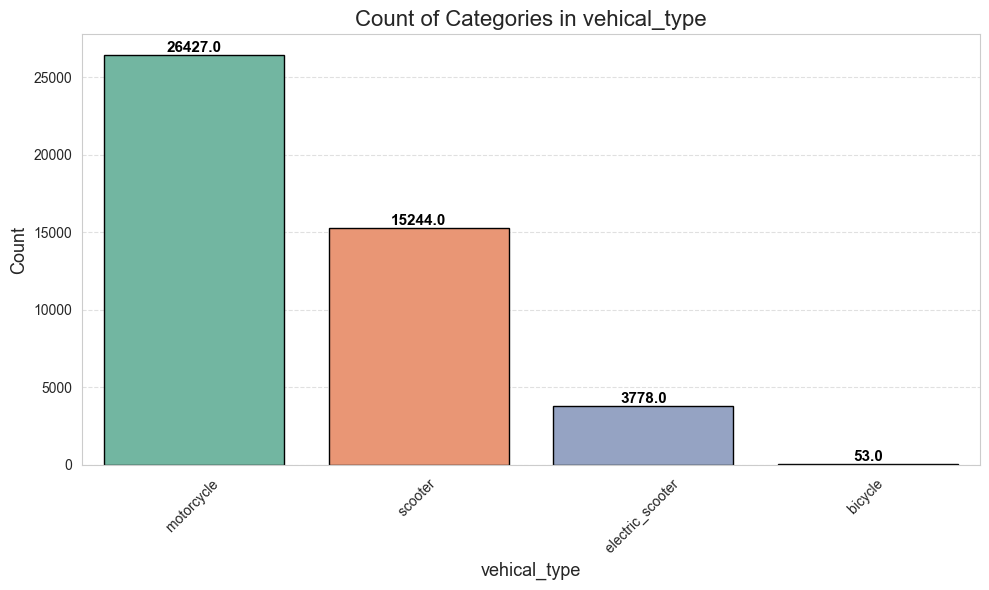

In [159]:
# analysis on vehicle type
categorical_analysis(data, "vehical_type")

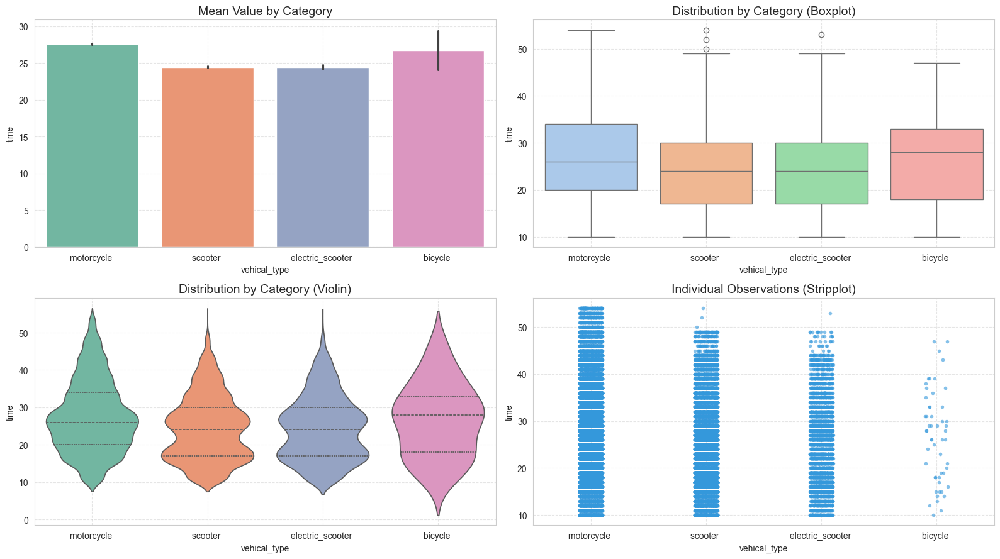

In [160]:
# does the type of vehicle affects delivery time
numerical_categorical_analysis(data, "vehical_type", "time")

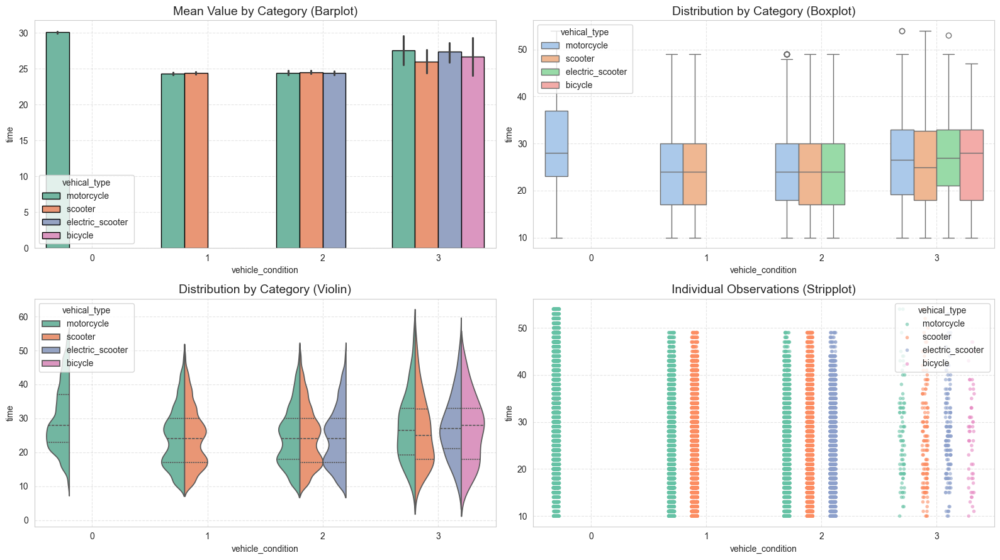

In [161]:
# vehicle condition and type
multivariate_analysis(data, "time", "vehicle_condition", "vehical_type")

In [162]:
# is their a relation between vehicle type and conditions
chi_2_test(data, "vehical_type", "vehicle_condition")


Contingency Table between 'vehical_type' and 'vehicle_condition':


vehicle_condition,0,1,2,3
vehical_type,,,,
bicycle,0,0,0,53
electric_scooter,0,0,3626,152
motorcycle,15009,7583,3753,82
scooter,0,7447,7655,142


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 28159.4382
Degrees of Freedom: 9
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant association between 'vehical_type' and 'vehicle_condition'.


### Type of Order

In [163]:
# type of order dtype
data['order_type'].dtype

dtype('O')

,Count,Percentage
order_type,,
snack,11512,25.3%
meal,11435,25.13%
drinks,11294,24.82%
buffet,11261,24.75%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in order_type column are ['snack ', 'drinks ', 'buffet ', 'meal ']
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in order_type column are 4


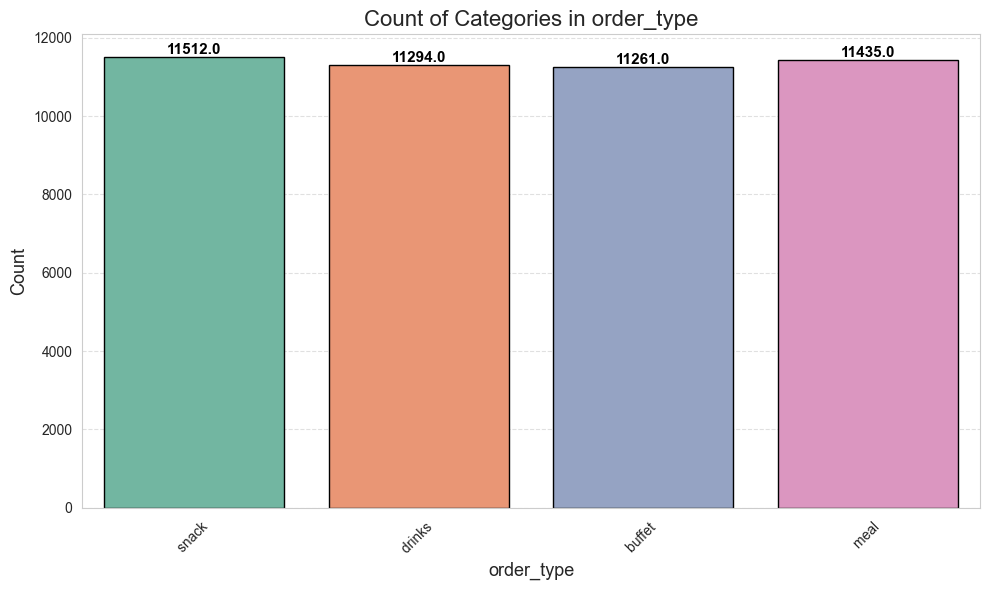

In [164]:
# analysis on type of order
categorical_analysis(data, "order_type")

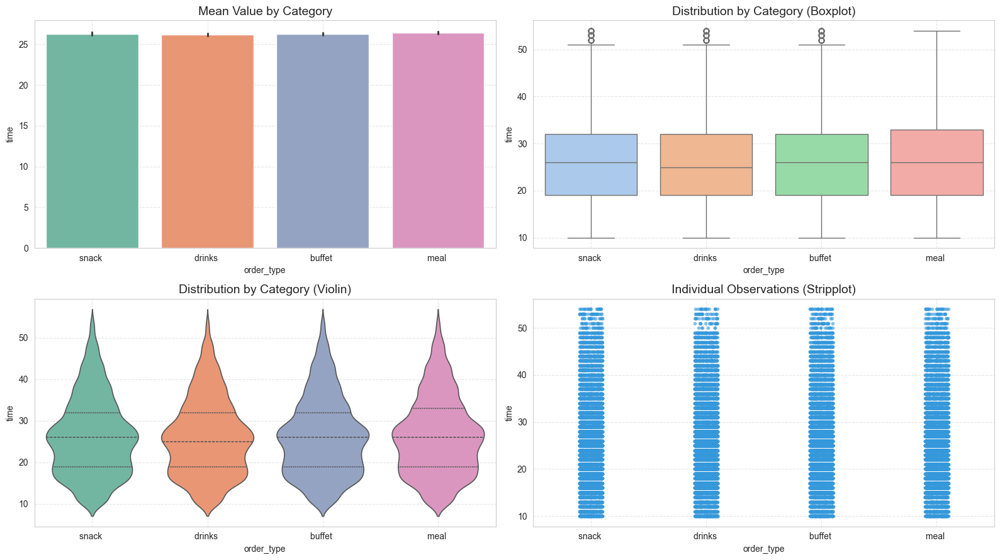

In [165]:
# does order type have have effect on delivery times
numerical_categorical_analysis(data, "order_type", "time")

In [166]:
# hypothesis test
anova_test(data, "time", "order_type")

ANOVA Results for 'time' by 'order_type':
F-statistic: 1.2099
P-value: 0.3043
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant relationship between 'time' and 'order_type'.


In [167]:
# contingency table
pd.crosstab(data["order_type"], data["is_weekend"])

is_weekend,0,1
order_type,,
buffet,8238,3023
drinks,8130,3164
meal,8290,3145
snack,8337,3175


In [169]:
# does type of order have an effect over pickup time
chi_2_test(data, "pickup_time", "order_type")


Contingency Table between 'pickup_time' and 'order_type':


order_type,buffet,drinks,meal,snack
pickup_time,,,,
-1435.0,33,30,41,35
-1430.0,56,63,66,76
-1425.0,119,77,103,132
5.0,3598,3632,3683,3651
10.0,3480,3602,3594,3612
15.0,3570,3493,3531,3585


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 23.1574
Degrees of Freedom: 15
P-value: 0.08085
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant association between 'pickup_time' and 'order_type'.


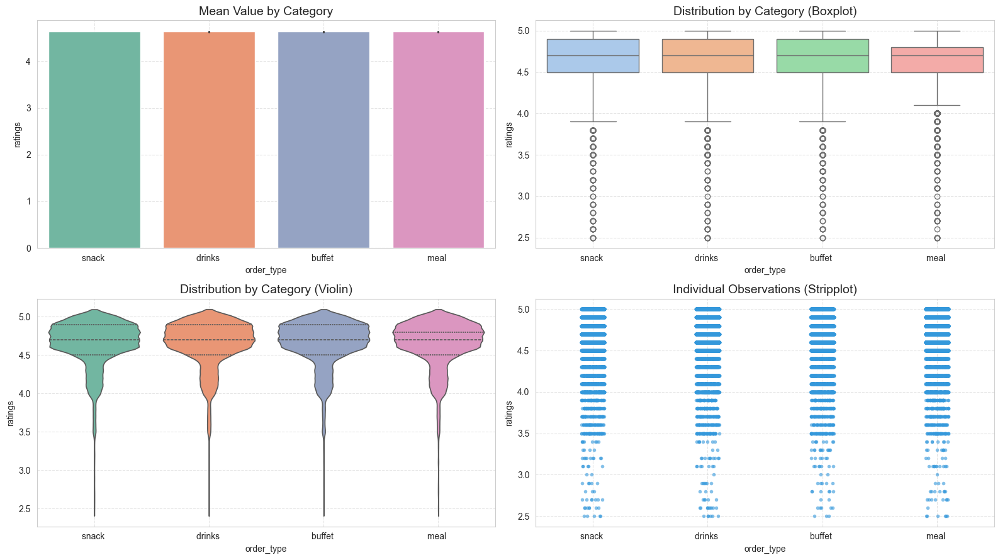

In [171]:
# does order type has an effect on ratings
numerical_categorical_analysis(data, "order_type", "ratings")

In [172]:
# is their a relationship between weekends and type of order
chi_2_test(data, "is_weekend", "order_type")


Contingency Table between 'is_weekend' and 'order_type':


order_type,buffet,drinks,meal,snack
is_weekend,,,,
0,8238,8130,8290,8337
1,3023,3164,3145,3175


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 3.9600
Degrees of Freedom: 3
P-value: 0.2658
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant association between 'is_weekend' and 'order_type'.


In [173]:
# is their a relationship between festivals and type of order
chi_2_test(data, "is_festival", "order_type")


Contingency Table between 'is_festival' and 'order_type':


order_type,buffet,drinks,meal,snack
is_festival,,,,
no,10985,11012,11165,11218
yes,217,219,215,243


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Chi-squared Statistic: 1.8002
Degrees of Freedom: 3
P-value: 0.6149
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Fail to reject the null hypothesis (p > 0.05). There is no significant association between 'is_festival' and 'order_type'.


### City Name


,Count,Percentage
city,,
JAP,3439,7.56%
RANCHI,3222,7.08%
BANG,3184,7.0%
SUR,3182,6.99%
HYD,3177,6.98%
MUM,3168,6.96%
MYS,3164,6.95%
COIMB,3162,6.95%
VAD,3159,6.94%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in city column are ['INDO', 'BANG', 'COIMB', 'CHEN', 'HYD', 'RANCHI', 'MYS', 'DEH', 'KOC', 'PUNE', 'LUDH', 'KNP', 'MUM', 'KOL', 'JAP', 'SUR', 'GOA', 'AURG', 'AGR', 'VAD', 'ALH', 'BHP']
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in city column are 22


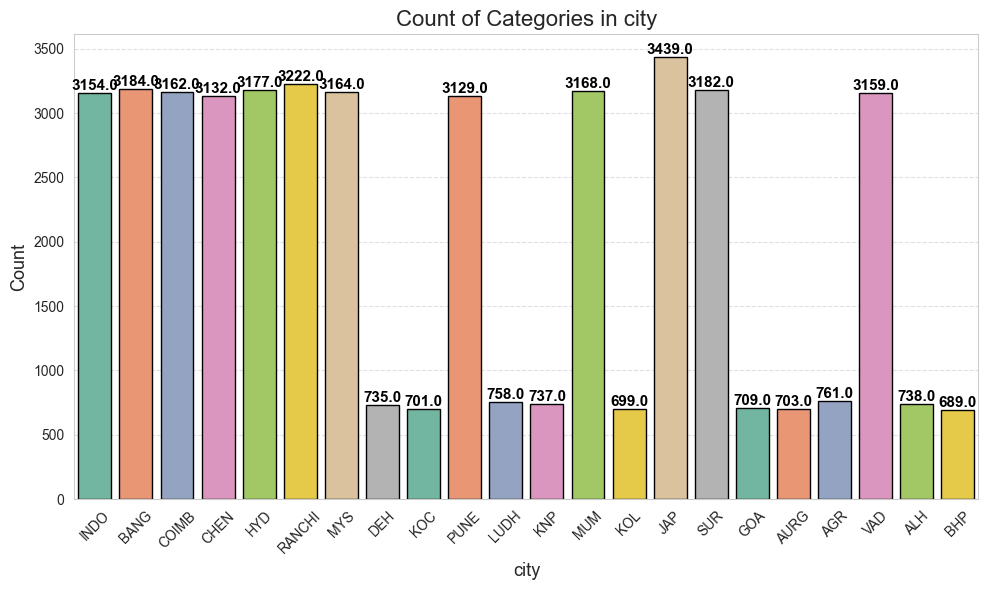

""


In [174]:
# categorical analysis on city 
pd.DataFrame(categorical_analysis(data, "city"))

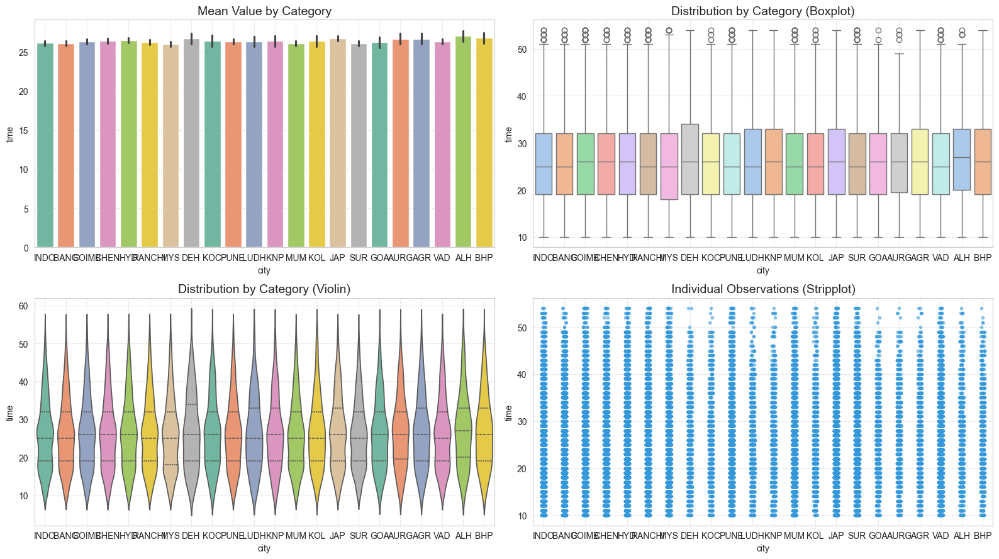

In [175]:
# does a city affects delivery times
numerical_categorical_analysis(data, "city", "time")

,Count,Percentage
city_category,,
metropolitian,34029,76.81%
urban,10111,22.82%
semi-urban,164,0.37%


-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The unique categories in city_category column are ['urban ', 'metropolitian ', 'semi-urban ', nan]
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
The number of categories in city_category column are 3


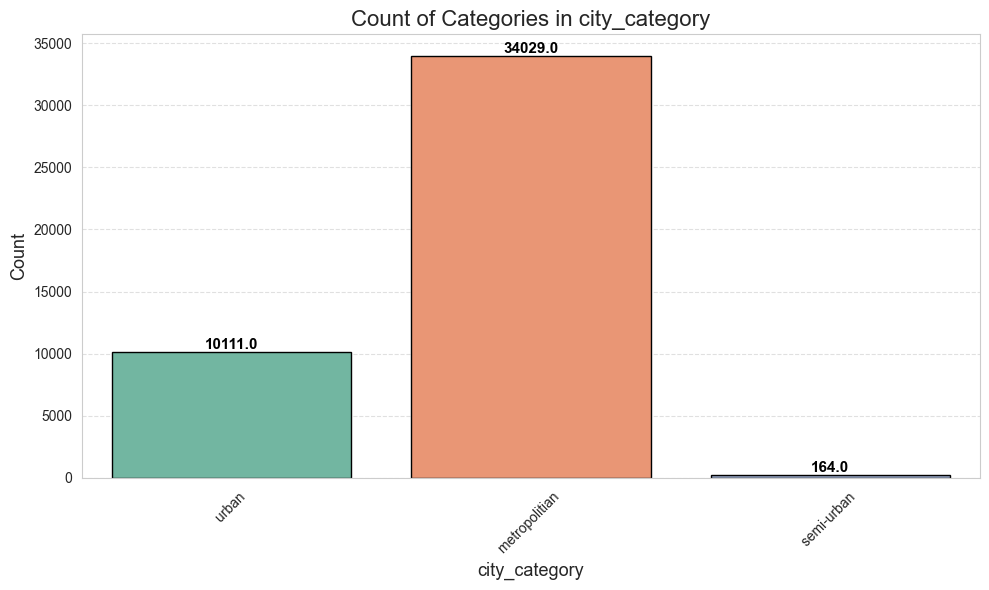

In [176]:
# categorical analysis on city type
categorical_analysis(data, "city_category")

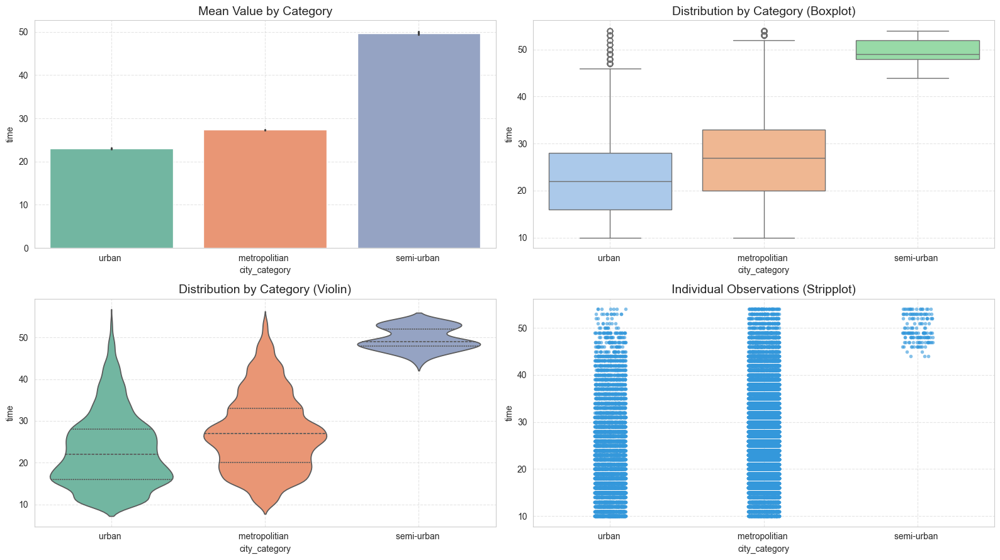

In [177]:
# does city types affect delivery times
numerical_categorical_analysis(data, "city_category", "time")

In [178]:
# hypothesis test
anova_test(data, "time", "city_category")

ANOVA Results for 'time' by 'city_category':
F-statistic: 1423.3223
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'city_category'.


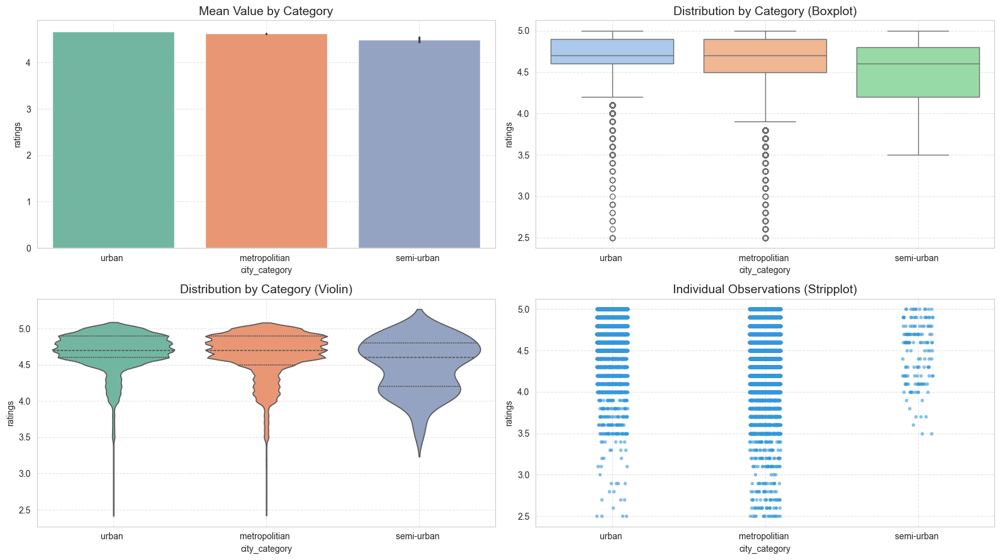

In [179]:
# does city type affects rider ratings
numerical_categorical_analysis(data, "city_category", "ratings")

In [180]:
# hypothesis test
anova_test(data, "time", "city_category")

ANOVA Results for 'time' by 'city_category':
F-statistic: 1423.3223
P-value: 0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Reject the null hypothesis (p ≤ 0.05). There is a significant relationship between 'time' and 'city_category'.


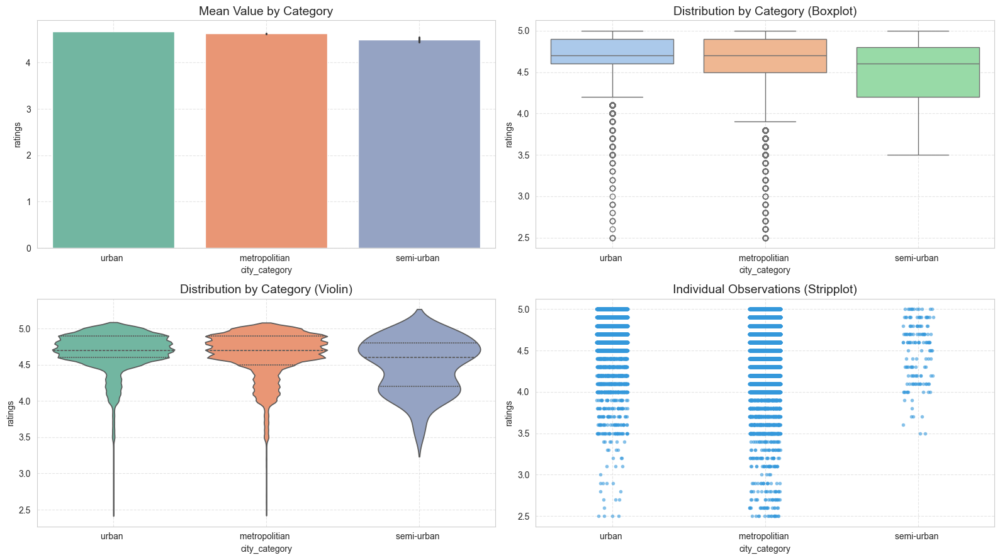

In [181]:
# does city type affects rider ratings
numerical_categorical_analysis(data, "city_category", "ratings")

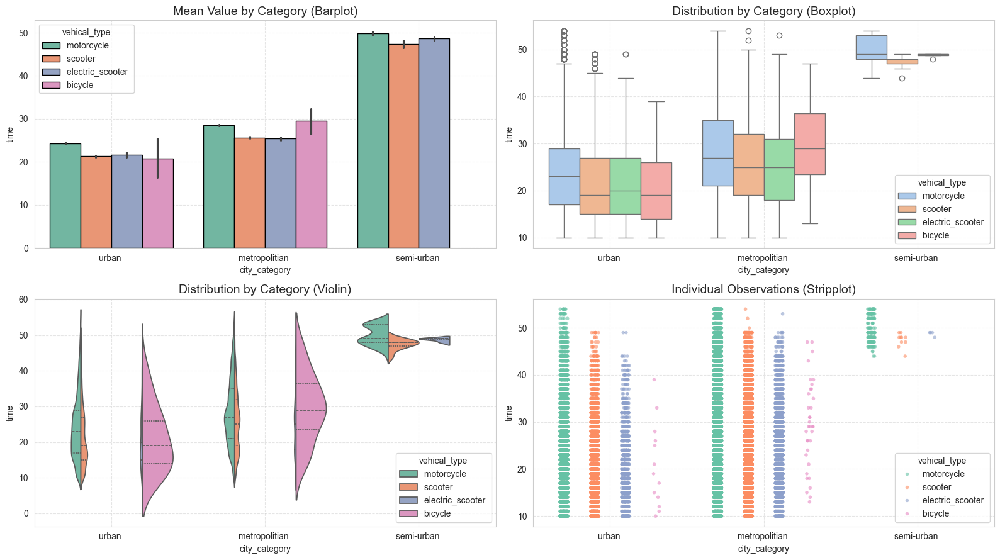

In [183]:
# city type, type of vehicle and delivery time analysis
multivariate_analysis(data, "time", "city_category", "vehical_type")

### Distance

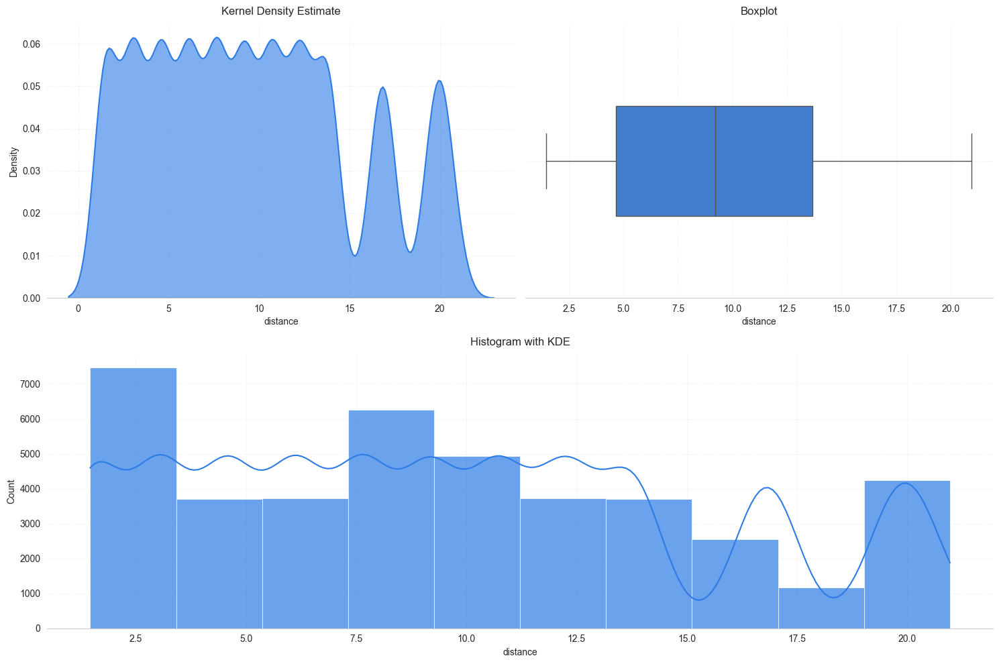

In [184]:
# numerical analysis of distance
numerical_analysis(data, "distance", bins = 10)

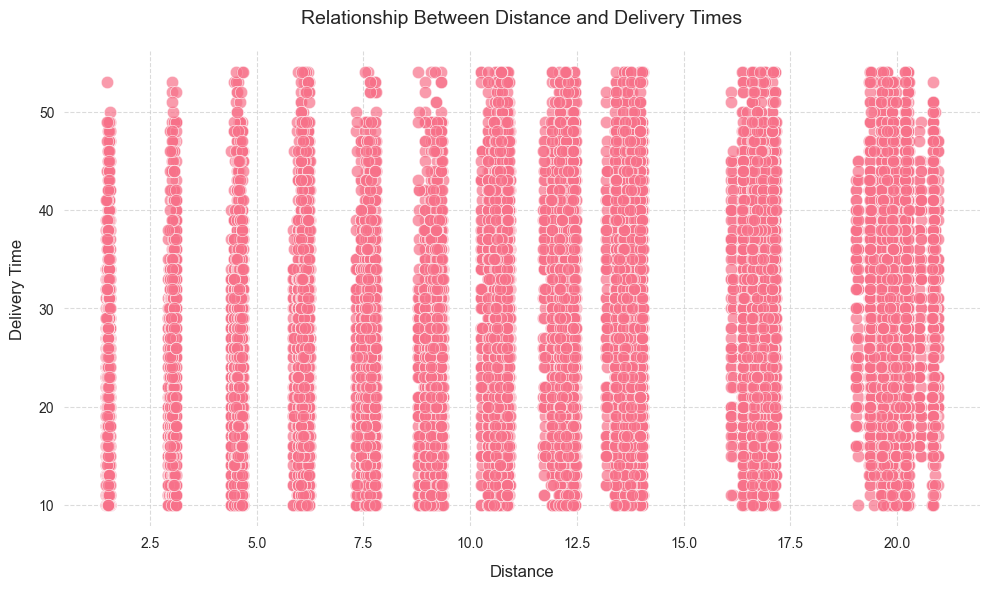

In [185]:
# relationship between distance and delivery times
plt.figure(figsize=(10, 6))

# Create scatter plot with enhanced parameters
scatter = sns.scatterplot(
    data = data, 
    x = "distance", 
    y = "time",
    alpha = 0.7,        # Slightly transparent points for better visibility of overlaps
    edgecolor = 'w',     # White edges around points
    linewidth = 0.5,     # Thin edge line
    s = 80              # Slightly larger point size
)

# Add proper labels and title
scatter.set_xlabel("Distance", fontsize = 12, labelpad = 10)
scatter.set_ylabel("Delivery Time", fontsize = 12, labelpad = 10)
scatter.set_title("Relationship Between Distance and Delivery Times", 
                 fontsize=14, pad=20)

# Adjust grid and spines for cleaner look
scatter.grid(True, linestyle='--', alpha=0.7)
sns.despine(left=True, bottom=True)

# Show plot with tight layout
plt.tight_layout()
plt.show()

In [186]:
# corr
data[["distance", "time"]].corr()

,distance,time
distance,1.000000,0.321176
time,0.321176,1.000000


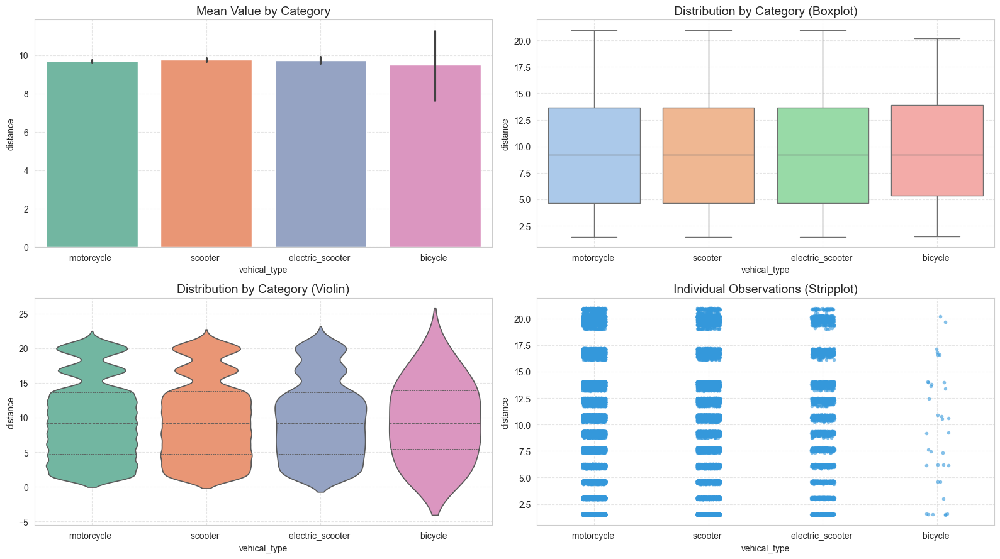

In [188]:
# vehicle type and distance analysis
numerical_categorical_analysis(data, "vehical_type", "distance")

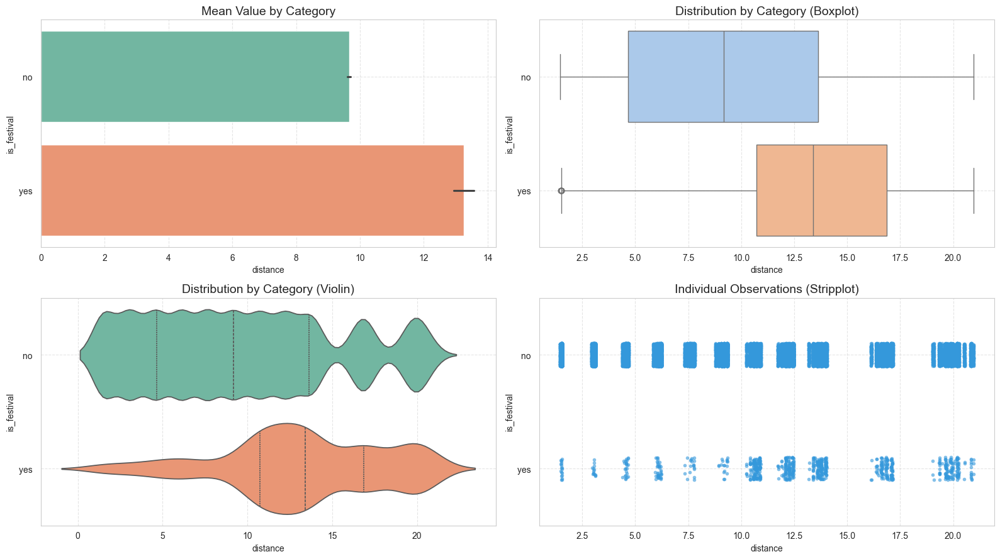

In [189]:
# do riders cover more distances during festivals
numerical_categorical_analysis(data, "distance", "is_festival")

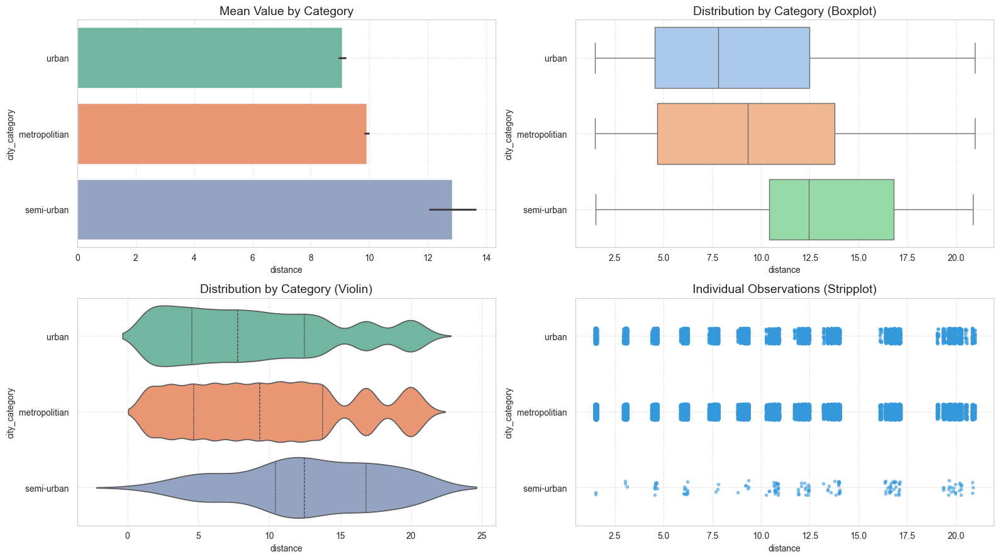

In [190]:
# distance and city type
numerical_categorical_analysis(data, "distance", "city_category")

In [191]:
# new feature based on distance
data = data.assign(
                        distance_type = pd.cut(data["distance"], bins = [0,5,10,15,25],
                                               right = False, labels = ["short","medium","long","very_long"])
                                    )

In [192]:
data.sample(5)

,id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked,weather,traffic,vehicle_condition,order_type,vehical_type,multiple_deliveries,is_festival,city_category,time,city,day,month,year,day_of_week,is_weekend,order_time_hour,order_time_of_day,pickup_time,distance,distance_type,time_taken_pt
23508,0x790d,21.0,5.0,23.355164,85.324097,23.395164,85.364097,2022-03-19,2025-05-23 16:00:00,2025-05-23 16:10:00,sunny,medium,2,drinks,scooter,0.0,no,urban,12,RANCHI,19,3,2022,Saturday,1,16.0,afternoon,10.0,6.037529,medium,-1.794080
10469,0xacd,26.0,4.9,11.016298,76.972076,11.076298,77.032076,2022-03-26,2025-05-23 23:50:00,2025-05-23 00:05:00,sandstorms,low,1,meal,motorcycle,0.0,no,metropolitian,10,COIMB,26,3,2022,Saturday,1,23.0,night,-1425.0,9.348206,medium,-2.168378
16904,0x2798,27.0,4.8,21.175104,72.804342,21.285104,72.914342,2022-03-31,2025-05-23 22:25:00,2025-05-23 22:40:00,fog,low,1,snack,motorcycle,1.0,no,urban,25,SUR,31,3,2022,Thursday,0,22.0,night,15.0,16.721203,very_long,-0.019371
42640,0xa06a,21.0,4.7,23.399250,85.390464,23.439250,85.430464,2022-03-24,2025-05-23 12:15:00,2025-05-23 12:30:00,windy,high,1,meal,motorcycle,0.0,no,metropolitian,19,RANCHI,24,3,2022,Thursday,0,12.0,afternoon,15.0,6.036610,medium,-0.735747
40073,0xd0e9,30.0,NaN,22.549100,88.400467,22.609100,88.460467,2022-02-15,2025-05-23 18:10:00,2025-05-23 18:25:00,windy,medium,2,buffet,electric_scooter,1.0,no,metropolitian,25,KOL,15,2,2022,Tuesday,0,18.0,evening,15.0,9.080802,medium,-0.019371


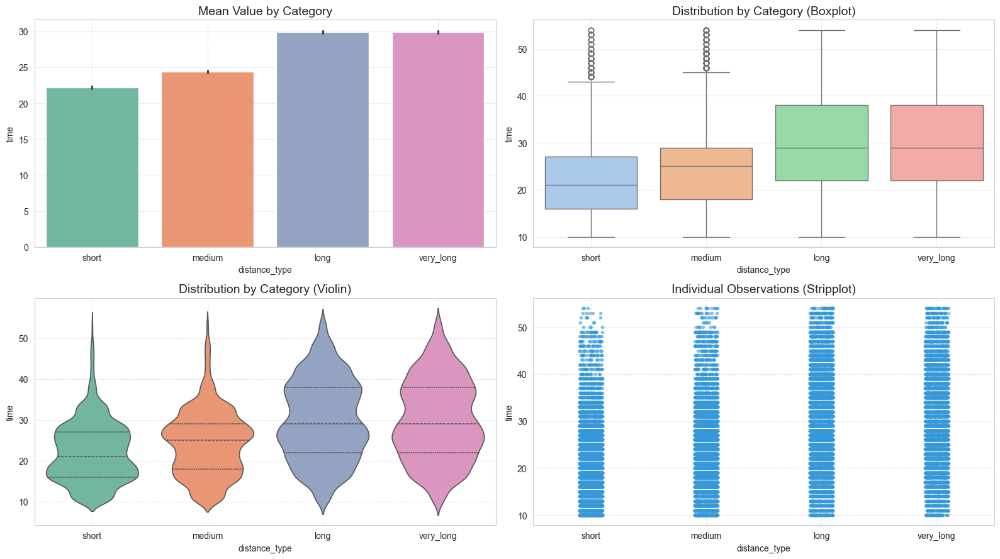

In [193]:
# does distance type affects delivery times
numerical_categorical_analysis(data, "distance_type", "time")

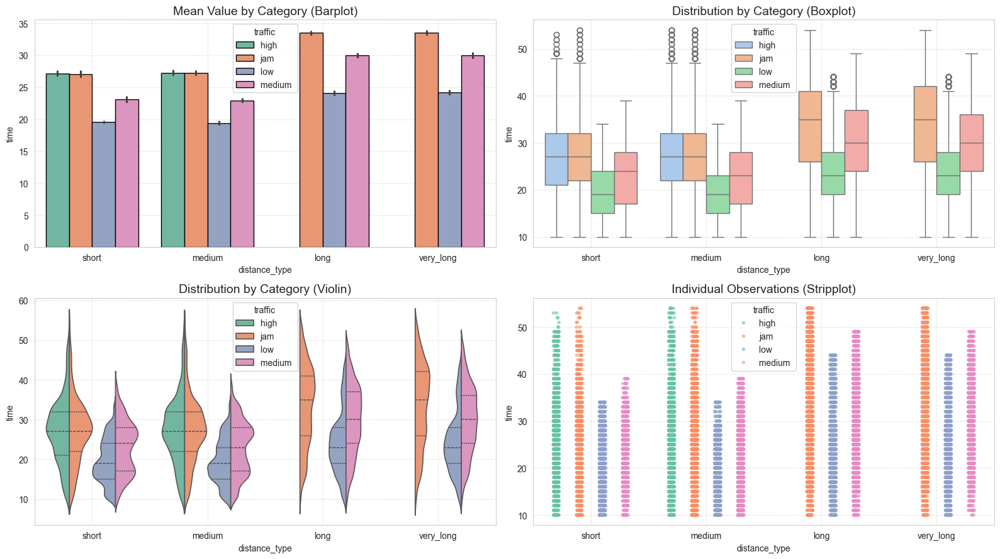

In [194]:
# delivery times based on distance and traffic
multivariate_analysis(data, "time", "distance_type", "traffic")